<a href="https://colab.research.google.com/github/tk1cntt/catboost-samples/blob/ea/catboost_conditional_EURUSD_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install catboost

     |████████████████████████████████| 65.8MB 53kB/s 


In [2]:
#import MetaTrader5 as mt5
import pandas as pd
import numpy as np
from datetime import datetime
import random
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import mixture

import warnings
warnings.filterwarnings('ignore')

#mt5.initialize()

MA_PERIODS = [5, 15, 25, 50, 75,
              100, 125, 150, 200, 250, 300, 350, 400, 450, 500]

SYMBOL = 'EURUSD'
MARKUP = 0.00010
#TIMEFRAME = mt5.TIMEFRAME_H1
START_DATE = datetime(2017, 1, 1)
TSTART_DATE = datetime(2015, 1, 1)
FULL_DATE = datetime(2015, 1, 1)
STOP_DATE = datetime(2022, 1, 1)
hours = [5]
n_compnents = 75

def v2get_prices():
  df_prices = pd.read_csv("./sample_data/EURUSD_mt5_bars_h1_2019_2020.csv")[['date', 'time', 'close']]
  return get_prices(df_prices)

def v2get_prices_test():
  df_prices = pd.read_csv("./sample_data/EURUSD_mt5_bars_h1_2016_2020.csv")[['date', 'time', 'close']]
  return get_prices(df_prices)

def get_prices(df_prices):
  cb_prices = pd.DataFrame()
  cb_prices['sdate'] = df_prices['date'].astype(str) + " " + df_prices['time']
  cb_prices['time'] = pd.to_datetime(cb_prices.sdate, format='%Y%m%d %H:%M:%S')
  cb_prices['close'] = df_prices['close']
  #cb_prices['time'] = cb_prices.stime.values.astype(np.int64)
  cb_prices.set_index('time')
  cb_prices.index = pd.to_datetime(cb_prices.time, unit='s')
  cb_prices = cb_prices.drop(columns=['sdate', 'time'])
  pr = cb_prices.copy()
  count = 0
  for i in MA_PERIODS:
    cb_prices[str(count)] = pr['close'] - pr['close'].rolling(i).mean()
    count += 1
  return cb_prices.dropna()


In [3]:

def time_filter(data, count):
    # filter by hour
    global hours
    if data.index[count].hour not in hours:
        return False

    # filter by day of week
    # days = [2]
    # if data.index[count].dayofweek not in days:
    #     return False

    return True


def add_labels(dataset, min, max, filter=time_filter):
    labels = []
    for i in range(dataset.shape[0]-max):
        rand = random.randint(min, max)
        curr_pr = dataset['close'][i]
        future_pr = dataset['close'][i + rand]
        if filter(dataset, i):
            if future_pr + MARKUP < curr_pr:
                labels.append(1.0)
            elif future_pr - MARKUP > curr_pr:
                labels.append(0.0)
            else:
                labels.append(2.0)
        else:
            labels.append(2.0)
    dataset = dataset.iloc[:len(labels)].copy()
    dataset['labels'] = labels
    dataset = dataset.dropna()
    dataset = dataset.drop(
        dataset[dataset.labels == 2].index)

    return dataset




In [18]:

def tester(dataset, markup=0.0, plot=False, filter=time_filter):
    last_deal = int(2)
    last_price = 0.0
    report = [0.0]
    for i in range(dataset.shape[0]):
        pred = dataset['labels'][i]
        ind = dataset.index[i].hour
        if last_deal == 2 and filter(dataset, i):
            last_price = dataset['close'][i]
            last_deal = 0 if pred <= 0.5 else 1
            continue
        if last_deal == 0 and pred > 0.5:
            last_deal = 2
            report.append(report[-1] - markup +
                          (dataset['close'][i] - last_price))
            continue
        if last_deal == 1 and pred < 0.5:
            last_deal = 2
            report.append(report[-1] - markup +
                          (last_price - dataset['close'][i]))

    y = np.array(report).reshape(-1, 1)
    X = np.arange(len(report)).reshape(-1, 1)
    lr = LinearRegression()
    lr.fit(X, y)

    l = lr.coef_
    if l >= 0:
        l = 1
    else:
        l = -1

    if(plot):
        plt.plot(report)
        plt.plot(lr.predict(X))
        plt.title("Strategy performance")
        plt.xlabel("the number of trades")
        plt.ylabel("cumulative profit in pips")
        plt.show()

    return lr.score(X, y) * l, report


def brute_force(samples, gmm):
    # # make dataset
    # pr = get_prices(START_DATE, STOP_DATE)
    # pr = add_labels(pr, min=5, max=25, filter=time_filter)
    # # tester(pr, MARKUP, plot=True, filter=time_filter)
    # pr = pr[pr.columns[1:]]
    # # perform GMM clasterizatin over dataset
    # prUp = pr[pr['labels'] == 0]
    # prDwn = pr[pr['labels'] == 1]
    # gmmUp = mixture.GaussianMixture(
    #     n_components=n_compnents, covariance_type='full', n_init=1).fit(prUp[prUp.columns[:-1]])
    # gmmDwn = mixture.GaussianMixture(
    #     n_components=n_compnents, covariance_type='full', n_init=1).fit(prDwn[prDwn.columns[:-1]])

    # # sample new dataset
    # generatedUp = gmmUp.sample(samples)
    # generatedDwn = gmmDwn.sample(samples)

    # genUp = pd.DataFrame(generatedUp[0])
    # genUp['labels'] = 0
    # genDwn = pd.DataFrame(generatedDwn[0])
    # genDwn['labels'] =1

    # gen = pd.concat([genUp, genDwn])
    # sample new dataset

    # sample new dataset
    generated = gmm.sample(samples)
    # make labels
    gen = pd.DataFrame(generated[0])
    gen.rename(columns={gen.columns[-1]: "labels"}, inplace=True)
    gen.loc[gen['labels'] >= 0.5, 'labels'] = 1
    gen.loc[gen['labels'] < 0.5, 'labels'] = 0

    X = gen[gen.columns[:-1]]
    y = gen[gen.columns[-1]]

    X = gen[gen.columns[:-1]]
    y = gen[gen.columns[-1]]

    # train\test split
    train_X, test_X, train_y, test_y = train_test_split(
        X, y, train_size=0.5, test_size=0.5, shuffle=True)
    # learn with train and validation subsets
    model = CatBoostClassifier(iterations=1000,
                               depth=6,
                               learning_rate=0.01,
                               custom_loss=['Accuracy'],
                               eval_metric='Accuracy',
                               verbose=False,
                               use_best_model=True,
                               task_type='CPU')
    model.fit(train_X, train_y, eval_set=(test_X, test_y),
              early_stopping_rounds=25, plot=False)
    # test on new data
    pr_tst = v2get_prices_test()
    X = pr_tst[pr_tst.columns[1:]]
    X.columns = [''] * len(X.columns)

    # test the learned model
    p = model.predict_proba(X)
    p2 = [x[0] < 0.5 for x in p]
    pr2 = pr_tst.iloc[:len(p2)].copy()
    pr2['labels'] = p2
    R2, report = tester(pr2, MARKUP, plot=False, filter=time_filter)
    report.sort()
    
    return [R2, model, report[-1]]


def test_model(result, plot=False):
    pr_tst = v2get_prices_test()
    X = pr_tst[pr_tst.columns[1:]]
    X.columns = [''] * len(X.columns)

    # test the learned model
    p = result[1].predict_proba(X)
    p2 = [x[0] < 0.5 for x in p]
    pr2 = pr_tst.iloc[:len(p2)].copy()
    pr2['labels'] = p2
    R2, report = tester(pr2, MARKUP, plot, filter=time_filter)
    report.sort()
    print("Score:", report[-1])

def exploratory_analysis():
    h = [x for x in range(24)]
    result = pd.DataFrame()
    for _h in h:
        global hours 
        hours = [_h]
        pr = v2get_prices()
        pr = add_labels(pr, min=11, max=11, filter=time_filter)
        gmm = mixture.GaussianMixture(
            n_components=n_compnents, covariance_type='full', n_init=1).fit(pr[pr.columns[1:]])

        # iterative learning
        res = []
        iterations = 10
        for i in range(iterations):
            res.append(brute_force(10000, gmm))
            print('Iteration: ', i, 'R^2: ', res[-1][0], ' hour= ', _h)
        
        r = pd.DataFrame(np.array(res)[:, 0], np.full(iterations,_h))
        result = result.append(r)

    plt.scatter(result.index, result, c = result.index)
    plt.xticks(np.arange(0, 24, 1))
    plt.title("Performance by hour")
    plt.xlabel("hours")
    plt.ylabel("R^2 estimation")
    plt.show()
    return result

def deals_frequency_analyzer():
    freq = [x for x in range(1,24)]
    #result = pd.DataFrame()
    for _h in freq:
        global hours 
        hours = [_h]
        print('Start analysis ', _h, 'h')
        pr = v2get_prices()
        result = pd.DataFrame()
        for _ih in freq:
          prh = pr.copy()
          prh = add_labels(prh, min=_ih, max=_ih, filter=time_filter)
          #print(prh)
          #gmm = mixture.GaussianMixture(n_components=n_compnents, covariance_type='full', n_init=1).fit(prh[prh.columns[1:]])
          gmm = mixture.BayesianGaussianMixture(n_components=n_compnents, covariance_type='full').fit(prh[prh.columns[1:]])
          # iterative learning
          res = []
          iterations = 10
          for i in range(iterations):
              res.append(brute_force(10000, gmm))
              print('Iteration: ', i, 'R^2: ', res[-1][0],' hour= ', _h, ' deal lifetime=', _ih, ' best score=', res[-1][2] )
          
          r = pd.DataFrame(np.array(res)[:, 0], np.full(iterations,_ih))
          result = result.append(r)
        plt.scatter(result.index, result, c = result.index)
        plt.xticks(np.arange(1, len(freq)+1, 1))
        plt.title("Performance by deals lifetime")
        plt.xlabel("deals frequency")
        plt.ylabel("R^2 estimation")
        plt.show()
    return 0

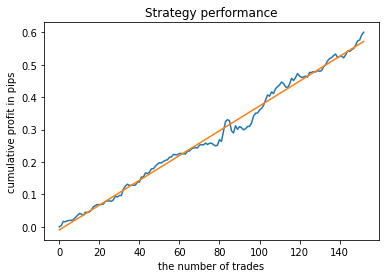

0.6002100000000004


In [5]:
hours = [17]
# make dataset
pr = v2get_prices()
pr = add_labels(pr, min=11, max=11, filter=time_filter)
pr, report = tester(pr, MARKUP, plot=True, filter=time_filter)
report.sort()
print(report[-1])

In [ ]:
r = exploratory_analysis()

Start analysis  1 h
Iteration:  0 R^2:  -0.07177433414667722  hour=  1  deal lifetime =  1
Iteration:  1 R^2:  -0.8878623593194652  hour=  1  deal lifetime =  1
Iteration:  2 R^2:  0.001565229171436422  hour=  1  deal lifetime =  1
Iteration:  3 R^2:  -0.2147109295369486  hour=  1  deal lifetime =  1
Iteration:  4 R^2:  -0.88959218063888  hour=  1  deal lifetime =  1
Iteration:  5 R^2:  -0.4228690945078867  hour=  1  deal lifetime =  1
Iteration:  6 R^2:  -0.8553050622281931  hour=  1  deal lifetime =  1
Iteration:  7 R^2:  -0.7538654999637577  hour=  1  deal lifetime =  1
Iteration:  8 R^2:  -0.4517429534669103  hour=  1  deal lifetime =  1
Iteration:  9 R^2:  -0.4271486039264891  hour=  1  deal lifetime =  1
Iteration:  0 R^2:  -0.893561494663808  hour=  1  deal lifetime =  2
Iteration:  1 R^2:  -0.6080160894107058  hour=  1  deal lifetime =  2
Iteration:  2 R^2:  -0.30858043667110246  hour=  1  deal lifetime =  2
Iteration:  3 R^2:  -0.7751080756767226  hour=  1  deal lifetime =  2


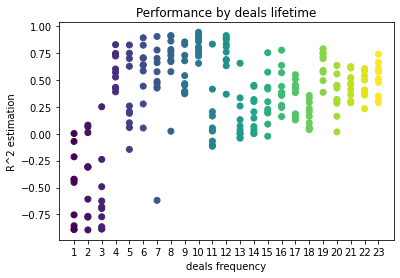

Start analysis  2 h
Iteration:  0 R^2:  -0.6456308712275207  hour=  2  deal lifetime =  1
Iteration:  1 R^2:  -0.7869255403669629  hour=  2  deal lifetime =  1
Iteration:  2 R^2:  -0.5944748220662209  hour=  2  deal lifetime =  1
Iteration:  3 R^2:  -0.7986367646707323  hour=  2  deal lifetime =  1
Iteration:  4 R^2:  -0.7661231707515802  hour=  2  deal lifetime =  1
Iteration:  5 R^2:  -0.5142632842055348  hour=  2  deal lifetime =  1
Iteration:  6 R^2:  -0.7942230915415117  hour=  2  deal lifetime =  1
Iteration:  7 R^2:  -0.3989355733562308  hour=  2  deal lifetime =  1
Iteration:  8 R^2:  -0.9315051669659267  hour=  2  deal lifetime =  1
Iteration:  9 R^2:  -0.9279853601858915  hour=  2  deal lifetime =  1
Iteration:  0 R^2:  0.1943001100250038  hour=  2  deal lifetime =  2
Iteration:  1 R^2:  0.05494984504908995  hour=  2  deal lifetime =  2
Iteration:  2 R^2:  0.6069674637746872  hour=  2  deal lifetime =  2
Iteration:  3 R^2:  0.46661850552247996  hour=  2  deal lifetime =  2
It

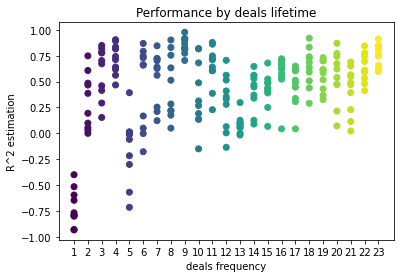

Start analysis  3 h
Iteration:  0 R^2:  0.6442195739791254  hour=  3  deal lifetime =  1
Iteration:  1 R^2:  -0.2168795419157401  hour=  3  deal lifetime =  1
Iteration:  2 R^2:  0.04373195685567944  hour=  3  deal lifetime =  1
Iteration:  3 R^2:  -0.6125502950308073  hour=  3  deal lifetime =  1
Iteration:  4 R^2:  0.48889789316181054  hour=  3  deal lifetime =  1
Iteration:  5 R^2:  0.879494650637433  hour=  3  deal lifetime =  1
Iteration:  6 R^2:  0.7673991592124734  hour=  3  deal lifetime =  1
Iteration:  7 R^2:  0.880701826996003  hour=  3  deal lifetime =  1
Iteration:  8 R^2:  0.5715175529010497  hour=  3  deal lifetime =  1
Iteration:  9 R^2:  0.015902447072294046  hour=  3  deal lifetime =  1
Iteration:  0 R^2:  0.4068572436840374  hour=  3  deal lifetime =  2
Iteration:  1 R^2:  0.7824266360151619  hour=  3  deal lifetime =  2
Iteration:  2 R^2:  0.030460372433549265  hour=  3  deal lifetime =  2
Iteration:  3 R^2:  0.74329943550782  hour=  3  deal lifetime =  2
Iteration:

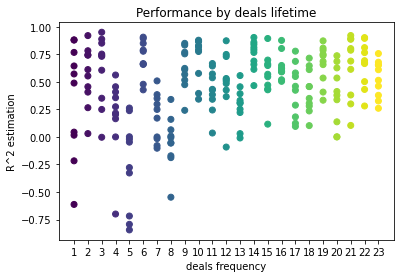

Start analysis  4 h
Iteration:  0 R^2:  0.7594427075245759  hour=  4  deal lifetime =  1
Iteration:  1 R^2:  0.38227083044108123  hour=  4  deal lifetime =  1
Iteration:  2 R^2:  0.5182519780908177  hour=  4  deal lifetime =  1
Iteration:  3 R^2:  0.6980550973532491  hour=  4  deal lifetime =  1
Iteration:  4 R^2:  0.880327037330965  hour=  4  deal lifetime =  1
Iteration:  5 R^2:  0.9148215565038564  hour=  4  deal lifetime =  1
Iteration:  6 R^2:  0.741281953079008  hour=  4  deal lifetime =  1
Iteration:  7 R^2:  0.8507636565542092  hour=  4  deal lifetime =  1
Iteration:  8 R^2:  0.7372787687253138  hour=  4  deal lifetime =  1
Iteration:  9 R^2:  0.12234070851539224  hour=  4  deal lifetime =  1
Iteration:  0 R^2:  0.9408032307633803  hour=  4  deal lifetime =  2
Iteration:  1 R^2:  0.9152958697095653  hour=  4  deal lifetime =  2
Iteration:  2 R^2:  0.9466345104331169  hour=  4  deal lifetime =  2
Iteration:  3 R^2:  0.8068100844145162  hour=  4  deal lifetime =  2
Iteration:  4 

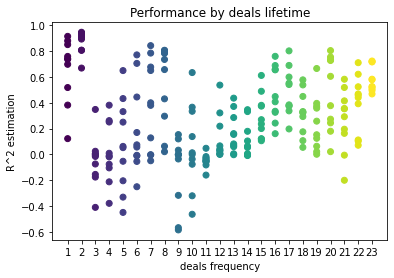

Start analysis  5 h
Iteration:  0 R^2:  0.14042842230064856  hour=  5  deal lifetime =  1
Iteration:  1 R^2:  0.5699075468903774  hour=  5  deal lifetime =  1
Iteration:  2 R^2:  0.6774578617865386  hour=  5  deal lifetime =  1
Iteration:  3 R^2:  0.9040343597718622  hour=  5  deal lifetime =  1
Iteration:  4 R^2:  0.5491710888874222  hour=  5  deal lifetime =  1
Iteration:  5 R^2:  0.6509273123597664  hour=  5  deal lifetime =  1
Iteration:  6 R^2:  0.9548936696881454  hour=  5  deal lifetime =  1
Iteration:  7 R^2:  0.8800548643742934  hour=  5  deal lifetime =  1
Iteration:  8 R^2:  0.8347702628178251  hour=  5  deal lifetime =  1
Iteration:  9 R^2:  0.5199102134653055  hour=  5  deal lifetime =  1
Iteration:  0 R^2:  0.016812474454716786  hour=  5  deal lifetime =  2
Iteration:  1 R^2:  -0.4563971901263276  hour=  5  deal lifetime =  2
Iteration:  2 R^2:  -0.15722372941827145  hour=  5  deal lifetime =  2
Iteration:  3 R^2:  -0.29955552751451964  hour=  5  deal lifetime =  2
Iterat

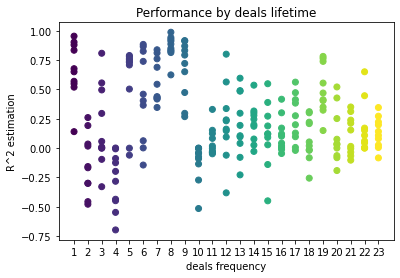

Start analysis  6 h
Iteration:  0 R^2:  -0.8458985828222011  hour=  6  deal lifetime =  1
Iteration:  1 R^2:  -0.07989972470387285  hour=  6  deal lifetime =  1
Iteration:  2 R^2:  -0.029305022058122576  hour=  6  deal lifetime =  1
Iteration:  3 R^2:  0.15622133966439478  hour=  6  deal lifetime =  1
Iteration:  4 R^2:  -0.5848943080202345  hour=  6  deal lifetime =  1
Iteration:  5 R^2:  0.06896517085595433  hour=  6  deal lifetime =  1
Iteration:  6 R^2:  -0.0452695384508347  hour=  6  deal lifetime =  1
Iteration:  7 R^2:  -0.4257101668391222  hour=  6  deal lifetime =  1
Iteration:  8 R^2:  -0.002155805117429521  hour=  6  deal lifetime =  1
Iteration:  9 R^2:  -0.03368140979145884  hour=  6  deal lifetime =  1
Iteration:  0 R^2:  -0.7868787281078128  hour=  6  deal lifetime =  2
Iteration:  1 R^2:  -0.9331095524795434  hour=  6  deal lifetime =  2
Iteration:  2 R^2:  -0.8477106424038305  hour=  6  deal lifetime =  2
Iteration:  3 R^2:  -0.44361126169993836  hour=  6  deal lifetim

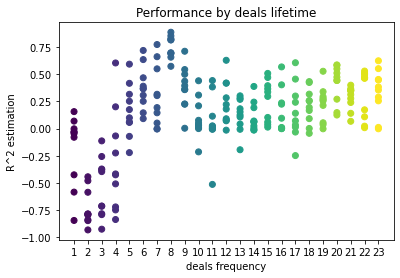

Start analysis  7 h
Iteration:  0 R^2:  -0.2773525818638517  hour=  7  deal lifetime =  1
Iteration:  1 R^2:  -0.19769533652011628  hour=  7  deal lifetime =  1
Iteration:  2 R^2:  -0.4819261290079161  hour=  7  deal lifetime =  1
Iteration:  3 R^2:  -0.2919238040487143  hour=  7  deal lifetime =  1
Iteration:  4 R^2:  -0.6957070199210759  hour=  7  deal lifetime =  1
Iteration:  5 R^2:  -0.6169797520481273  hour=  7  deal lifetime =  1
Iteration:  6 R^2:  -0.2413512395860911  hour=  7  deal lifetime =  1
Iteration:  7 R^2:  -0.23113910109650315  hour=  7  deal lifetime =  1
Iteration:  8 R^2:  -0.015798096111504067  hour=  7  deal lifetime =  1
Iteration:  9 R^2:  -0.058632694217573555  hour=  7  deal lifetime =  1
Iteration:  0 R^2:  -0.15803871450498308  hour=  7  deal lifetime =  2
Iteration:  1 R^2:  -0.1380283618472279  hour=  7  deal lifetime =  2
Iteration:  2 R^2:  -0.5501373260672491  hour=  7  deal lifetime =  2
Iteration:  3 R^2:  -0.3735032291683014  hour=  7  deal lifetim

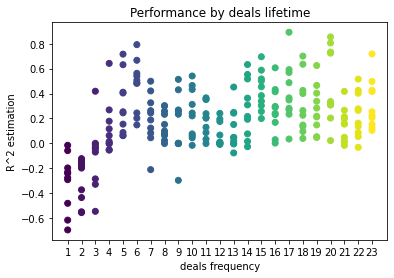

Start analysis  8 h
Iteration:  0 R^2:  0.0023636921274662326  hour=  8  deal lifetime =  1
Iteration:  1 R^2:  0.17734748700443448  hour=  8  deal lifetime =  1
Iteration:  2 R^2:  -0.08205158137032531  hour=  8  deal lifetime =  1
Iteration:  3 R^2:  -0.12616848864787156  hour=  8  deal lifetime =  1
Iteration:  4 R^2:  -0.22905917279717058  hour=  8  deal lifetime =  1
Iteration:  5 R^2:  -0.24120171665975565  hour=  8  deal lifetime =  1
Iteration:  6 R^2:  -0.03397006857396323  hour=  8  deal lifetime =  1
Iteration:  7 R^2:  -0.25789021670056034  hour=  8  deal lifetime =  1
Iteration:  8 R^2:  0.05402438259932141  hour=  8  deal lifetime =  1
Iteration:  9 R^2:  -0.08997641052604331  hour=  8  deal lifetime =  1
Iteration:  0 R^2:  -0.18907452855586382  hour=  8  deal lifetime =  2
Iteration:  1 R^2:  0.3299431959764718  hour=  8  deal lifetime =  2
Iteration:  2 R^2:  -0.7908408876247527  hour=  8  deal lifetime =  2
Iteration:  3 R^2:  -0.44516057121535113  hour=  8  deal life

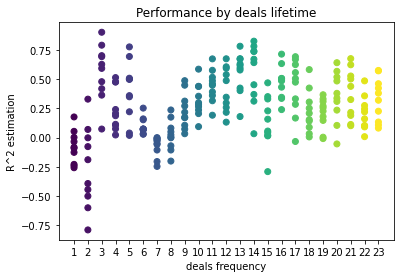

Start analysis  9 h
Iteration:  0 R^2:  -0.06665899280883858  hour=  9  deal lifetime =  1
Iteration:  1 R^2:  0.08932954492711166  hour=  9  deal lifetime =  1
Iteration:  2 R^2:  -0.13124200255093532  hour=  9  deal lifetime =  1
Iteration:  3 R^2:  -0.21655746520814656  hour=  9  deal lifetime =  1
Iteration:  4 R^2:  -0.05657003340194022  hour=  9  deal lifetime =  1
Iteration:  5 R^2:  0.08664949584467574  hour=  9  deal lifetime =  1
Iteration:  6 R^2:  -0.0033402443037454654  hour=  9  deal lifetime =  1
Iteration:  7 R^2:  -0.05371251302518609  hour=  9  deal lifetime =  1
Iteration:  8 R^2:  -0.5101906540406164  hour=  9  deal lifetime =  1
Iteration:  9 R^2:  -0.3290143423338062  hour=  9  deal lifetime =  1
Iteration:  0 R^2:  0.9168695219214574  hour=  9  deal lifetime =  2
Iteration:  1 R^2:  0.9340205047423527  hour=  9  deal lifetime =  2
Iteration:  2 R^2:  0.854579914919843  hour=  9  deal lifetime =  2
Iteration:  3 R^2:  0.7495036295208419  hour=  9  deal lifetime = 

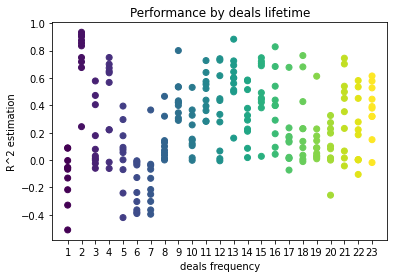

Start analysis  10 h
Iteration:  0 R^2:  -0.6033255955019318  hour=  10  deal lifetime =  1
Iteration:  1 R^2:  -0.8190393915058299  hour=  10  deal lifetime =  1
Iteration:  2 R^2:  -0.9058269920819391  hour=  10  deal lifetime =  1
Iteration:  3 R^2:  -0.6435640382251961  hour=  10  deal lifetime =  1
Iteration:  4 R^2:  -0.656959389595235  hour=  10  deal lifetime =  1
Iteration:  5 R^2:  -0.77116518192294  hour=  10  deal lifetime =  1
Iteration:  6 R^2:  -0.5277933508806882  hour=  10  deal lifetime =  1
Iteration:  7 R^2:  -0.6247657687423104  hour=  10  deal lifetime =  1
Iteration:  8 R^2:  -0.718767329289834  hour=  10  deal lifetime =  1
Iteration:  9 R^2:  -0.5452576320828243  hour=  10  deal lifetime =  1
Iteration:  0 R^2:  0.24987546823869433  hour=  10  deal lifetime =  2
Iteration:  1 R^2:  0.14635982496697064  hour=  10  deal lifetime =  2
Iteration:  2 R^2:  0.032141504661296505  hour=  10  deal lifetime =  2
Iteration:  3 R^2:  0.028525538427239816  hour=  10  deal l

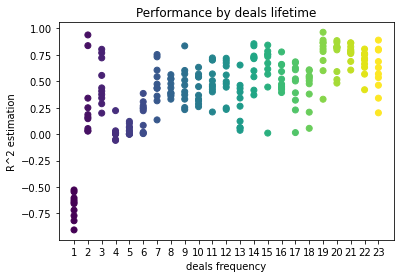

Start analysis  11 h
Iteration:  0 R^2:  0.077945476074059  hour=  11  deal lifetime =  1
Iteration:  1 R^2:  -0.007592728627013989  hour=  11  deal lifetime =  1
Iteration:  2 R^2:  0.05442516690935484  hour=  11  deal lifetime =  1
Iteration:  3 R^2:  0.11741748831797538  hour=  11  deal lifetime =  1
Iteration:  4 R^2:  -0.001634313490301298  hour=  11  deal lifetime =  1
Iteration:  5 R^2:  -0.3226726171909402  hour=  11  deal lifetime =  1
Iteration:  6 R^2:  -0.007764176416490187  hour=  11  deal lifetime =  1
Iteration:  7 R^2:  -0.08111633283551822  hour=  11  deal lifetime =  1
Iteration:  8 R^2:  0.8273965692877273  hour=  11  deal lifetime =  1
Iteration:  9 R^2:  -0.09921489824145124  hour=  11  deal lifetime =  1
Iteration:  0 R^2:  0.06701433158597692  hour=  11  deal lifetime =  2
Iteration:  1 R^2:  -0.13075407368688308  hour=  11  deal lifetime =  2
Iteration:  2 R^2:  0.24330118874466955  hour=  11  deal lifetime =  2
Iteration:  3 R^2:  -0.09194493831364148  hour=  1

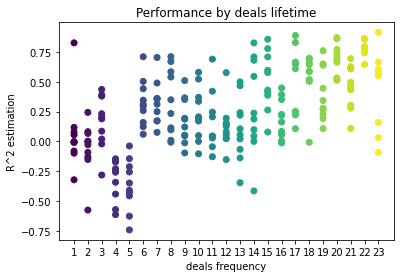

Start analysis  12 h
Iteration:  0 R^2:  0.03295202152179566  hour=  12  deal lifetime =  1
Iteration:  1 R^2:  -0.02842546707229332  hour=  12  deal lifetime =  1
Iteration:  2 R^2:  -0.27364382348889316  hour=  12  deal lifetime =  1
Iteration:  3 R^2:  0.017297600802362756  hour=  12  deal lifetime =  1
Iteration:  4 R^2:  0.1570482636503876  hour=  12  deal lifetime =  1
Iteration:  5 R^2:  0.52663092023738  hour=  12  deal lifetime =  1
Iteration:  6 R^2:  -0.3299409375432538  hour=  12  deal lifetime =  1
Iteration:  7 R^2:  -0.14068245962918702  hour=  12  deal lifetime =  1
Iteration:  8 R^2:  0.15086783517742441  hour=  12  deal lifetime =  1
Iteration:  9 R^2:  -0.10335313401235913  hour=  12  deal lifetime =  1
Iteration:  0 R^2:  -0.05100386745295937  hour=  12  deal lifetime =  2
Iteration:  1 R^2:  -0.04994886289845024  hour=  12  deal lifetime =  2
Iteration:  2 R^2:  0.06845508405140299  hour=  12  deal lifetime =  2
Iteration:  3 R^2:  -0.14034751119207667  hour=  12  

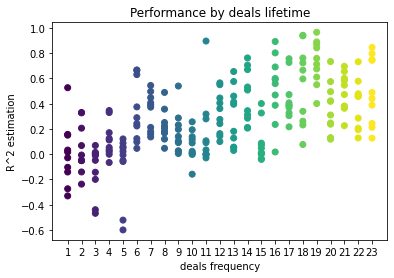

Start analysis  13 h
Iteration:  0 R^2:  -0.48063662045040745  hour=  13  deal lifetime =  1
Iteration:  1 R^2:  -0.4147055517116256  hour=  13  deal lifetime =  1
Iteration:  2 R^2:  -0.08163698871187064  hour=  13  deal lifetime =  1
Iteration:  3 R^2:  -0.6308890784862843  hour=  13  deal lifetime =  1
Iteration:  4 R^2:  0.026419165091644548  hour=  13  deal lifetime =  1
Iteration:  5 R^2:  0.09928555947951823  hour=  13  deal lifetime =  1
Iteration:  6 R^2:  0.059372599562500517  hour=  13  deal lifetime =  1
Iteration:  7 R^2:  0.33082896542240947  hour=  13  deal lifetime =  1
Iteration:  8 R^2:  0.6196779516446695  hour=  13  deal lifetime =  1
Iteration:  9 R^2:  0.006451540058556415  hour=  13  deal lifetime =  1
Iteration:  0 R^2:  -0.463074725384105  hour=  13  deal lifetime =  2
Iteration:  1 R^2:  -0.00010579399415688862  hour=  13  deal lifetime =  2
Iteration:  2 R^2:  -0.1023585174932874  hour=  13  deal lifetime =  2
Iteration:  3 R^2:  0.19464237555695263  hour=  1

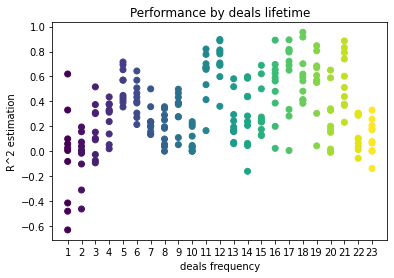

Start analysis  14 h
Iteration:  0 R^2:  -0.49581212034401767  hour=  14  deal lifetime =  1
Iteration:  1 R^2:  -0.13642473458236604  hour=  14  deal lifetime =  1
Iteration:  2 R^2:  0.14333416600368665  hour=  14  deal lifetime =  1
Iteration:  3 R^2:  0.7650151545223719  hour=  14  deal lifetime =  1
Iteration:  4 R^2:  0.34674496050165604  hour=  14  deal lifetime =  1
Iteration:  5 R^2:  -0.5773352497194857  hour=  14  deal lifetime =  1
Iteration:  6 R^2:  0.010706594669489977  hour=  14  deal lifetime =  1
Iteration:  7 R^2:  -0.7994209297949295  hour=  14  deal lifetime =  1
Iteration:  8 R^2:  0.12148590792543147  hour=  14  deal lifetime =  1
Iteration:  9 R^2:  0.014541520085876614  hour=  14  deal lifetime =  1
Iteration:  0 R^2:  0.2061116304712406  hour=  14  deal lifetime =  2
Iteration:  1 R^2:  0.15193116045054578  hour=  14  deal lifetime =  2
Iteration:  2 R^2:  0.018794807846864936  hour=  14  deal lifetime =  2
Iteration:  3 R^2:  0.7524193433160469  hour=  14  de

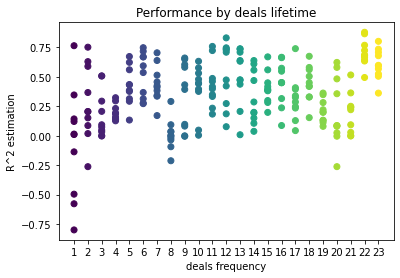

Start analysis  15 h
Iteration:  0 R^2:  0.44428965762796924  hour=  15  deal lifetime =  1
Iteration:  1 R^2:  0.29910525998609205  hour=  15  deal lifetime =  1
Iteration:  2 R^2:  0.7522463824586735  hour=  15  deal lifetime =  1
Iteration:  3 R^2:  0.25459249558609076  hour=  15  deal lifetime =  1
Iteration:  4 R^2:  0.24657524988293802  hour=  15  deal lifetime =  1
Iteration:  5 R^2:  0.10579406069441986  hour=  15  deal lifetime =  1
Iteration:  6 R^2:  0.36107034338247856  hour=  15  deal lifetime =  1
Iteration:  7 R^2:  0.1925937701009508  hour=  15  deal lifetime =  1
Iteration:  8 R^2:  0.24310146824231949  hour=  15  deal lifetime =  1
Iteration:  9 R^2:  0.4725211652679704  hour=  15  deal lifetime =  1
Iteration:  0 R^2:  0.13800837881737205  hour=  15  deal lifetime =  2
Iteration:  1 R^2:  0.3201748901424468  hour=  15  deal lifetime =  2
Iteration:  2 R^2:  0.5192192657938088  hour=  15  deal lifetime =  2
Iteration:  3 R^2:  0.013629112516132968  hour=  15  deal lif

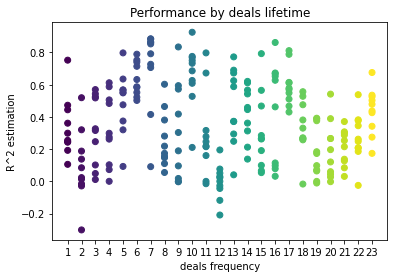

Start analysis  16 h
Iteration:  0 R^2:  0.02406078619733998  hour=  16  deal lifetime =  1
Iteration:  1 R^2:  0.3265881586673399  hour=  16  deal lifetime =  1
Iteration:  2 R^2:  0.04569319477693001  hour=  16  deal lifetime =  1
Iteration:  3 R^2:  0.24659491658580623  hour=  16  deal lifetime =  1
Iteration:  4 R^2:  0.000396294385305751  hour=  16  deal lifetime =  1
Iteration:  5 R^2:  -0.19199649140703134  hour=  16  deal lifetime =  1
Iteration:  6 R^2:  -0.22064260580352058  hour=  16  deal lifetime =  1
Iteration:  7 R^2:  -0.00958830681421885  hour=  16  deal lifetime =  1
Iteration:  8 R^2:  0.15720990867470164  hour=  16  deal lifetime =  1
Iteration:  9 R^2:  0.20035228361752222  hour=  16  deal lifetime =  1
Iteration:  0 R^2:  0.6272041607013635  hour=  16  deal lifetime =  2
Iteration:  1 R^2:  0.4323439503887683  hour=  16  deal lifetime =  2
Iteration:  2 R^2:  0.32079644065800716  hour=  16  deal lifetime =  2
Iteration:  3 R^2:  0.500223381512313  hour=  16  deal 

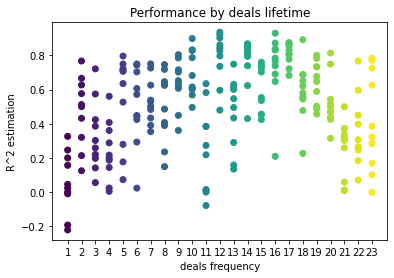

Start analysis  17 h
Iteration:  0 R^2:  0.40508619712659677  hour=  17  deal lifetime =  1
Iteration:  1 R^2:  0.26057415033975384  hour=  17  deal lifetime =  1
Iteration:  2 R^2:  -0.19523952386073906  hour=  17  deal lifetime =  1
Iteration:  3 R^2:  0.052471207241395416  hour=  17  deal lifetime =  1
Iteration:  4 R^2:  2.677631827674443e-05  hour=  17  deal lifetime =  1
Iteration:  5 R^2:  -0.29782648746378315  hour=  17  deal lifetime =  1
Iteration:  6 R^2:  -0.1441847667545345  hour=  17  deal lifetime =  1
Iteration:  7 R^2:  -0.2216085197660006  hour=  17  deal lifetime =  1
Iteration:  8 R^2:  -0.7073558418294915  hour=  17  deal lifetime =  1
Iteration:  9 R^2:  -0.003222715454989755  hour=  17  deal lifetime =  1
Iteration:  0 R^2:  0.6420822297510818  hour=  17  deal lifetime =  2
Iteration:  1 R^2:  0.5411078607261366  hour=  17  deal lifetime =  2
Iteration:  2 R^2:  0.6037652959835783  hour=  17  deal lifetime =  2
Iteration:  3 R^2:  0.8971809630841738  hour=  17  d

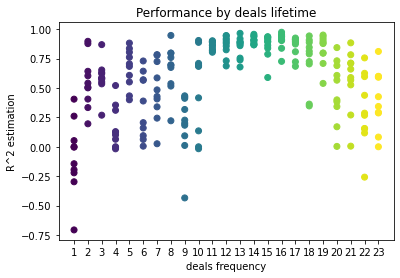

Start analysis  18 h
Iteration:  0 R^2:  -0.1869815897303515  hour=  18  deal lifetime =  1
Iteration:  1 R^2:  -0.4873815582081033  hour=  18  deal lifetime =  1
Iteration:  2 R^2:  -0.44495368966002824  hour=  18  deal lifetime =  1
Iteration:  3 R^2:  -0.7468628567496542  hour=  18  deal lifetime =  1
Iteration:  4 R^2:  -0.3768246001023545  hour=  18  deal lifetime =  1
Iteration:  5 R^2:  -0.7283571154365007  hour=  18  deal lifetime =  1
Iteration:  6 R^2:  -0.1625380827010685  hour=  18  deal lifetime =  1
Iteration:  7 R^2:  -0.08986086036644425  hour=  18  deal lifetime =  1
Iteration:  8 R^2:  -0.23437148461716917  hour=  18  deal lifetime =  1
Iteration:  9 R^2:  -0.4589628994649967  hour=  18  deal lifetime =  1
Iteration:  0 R^2:  -0.17483458987285438  hour=  18  deal lifetime =  2
Iteration:  1 R^2:  -0.26276002069884563  hour=  18  deal lifetime =  2
Iteration:  2 R^2:  -0.476619893371101  hour=  18  deal lifetime =  2
Iteration:  3 R^2:  -0.02338976192886688  hour=  18 

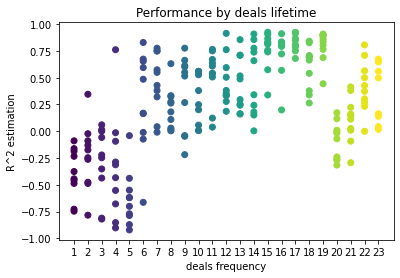

Start analysis  19 h
Iteration:  0 R^2:  -0.336700631812355  hour=  19  deal lifetime =  1
Iteration:  1 R^2:  -0.09589119372134769  hour=  19  deal lifetime =  1
Iteration:  2 R^2:  -0.2207404039915679  hour=  19  deal lifetime =  1
Iteration:  3 R^2:  -0.046974649117006995  hour=  19  deal lifetime =  1
Iteration:  4 R^2:  -0.06259433967839079  hour=  19  deal lifetime =  1
Iteration:  5 R^2:  -0.4150353975466249  hour=  19  deal lifetime =  1
Iteration:  6 R^2:  0.0977219831942584  hour=  19  deal lifetime =  1
Iteration:  7 R^2:  -0.01695763330833988  hour=  19  deal lifetime =  1
Iteration:  8 R^2:  0.21166152730171306  hour=  19  deal lifetime =  1
Iteration:  9 R^2:  -0.34884718000925186  hour=  19  deal lifetime =  1
Iteration:  0 R^2:  0.0004031411494805903  hour=  19  deal lifetime =  2
Iteration:  1 R^2:  0.02953064575110842  hour=  19  deal lifetime =  2
Iteration:  2 R^2:  -0.6766838704254199  hour=  19  deal lifetime =  2
Iteration:  3 R^2:  0.3203300946574412  hour=  19 

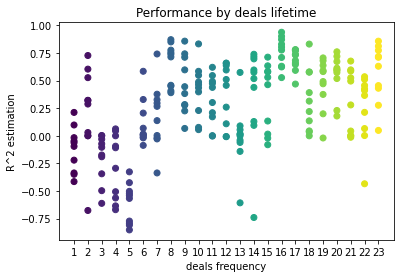

Start analysis  20 h
Iteration:  0 R^2:  0.19303249796184696  hour=  20  deal lifetime =  1
Iteration:  1 R^2:  0.04121905967272077  hour=  20  deal lifetime =  1
Iteration:  2 R^2:  0.21973339494721655  hour=  20  deal lifetime =  1
Iteration:  3 R^2:  0.24636785062857625  hour=  20  deal lifetime =  1
Iteration:  4 R^2:  0.0016593239154589767  hour=  20  deal lifetime =  1
Iteration:  5 R^2:  0.15734547435757062  hour=  20  deal lifetime =  1
Iteration:  6 R^2:  0.20012128261561446  hour=  20  deal lifetime =  1
Iteration:  7 R^2:  0.6800370339261459  hour=  20  deal lifetime =  1
Iteration:  8 R^2:  0.5252273254074  hour=  20  deal lifetime =  1
Iteration:  9 R^2:  0.4374259246017425  hour=  20  deal lifetime =  1
Iteration:  0 R^2:  -0.31408995178907595  hour=  20  deal lifetime =  2
Iteration:  1 R^2:  -0.5591437286896785  hour=  20  deal lifetime =  2
Iteration:  2 R^2:  -0.01146689158552816  hour=  20  deal lifetime =  2
Iteration:  3 R^2:  -0.6795846505337005  hour=  20  deal l

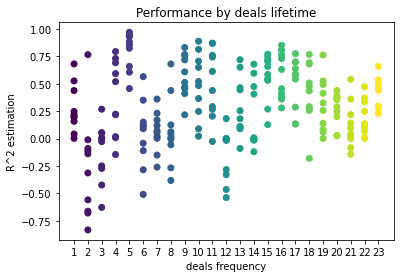

Start analysis  21 h
Iteration:  0 R^2:  0.8574981504080476  hour=  21  deal lifetime =  1
Iteration:  1 R^2:  0.7023269243583844  hour=  21  deal lifetime =  1
Iteration:  2 R^2:  0.013269038548461842  hour=  21  deal lifetime =  1
Iteration:  3 R^2:  0.8500471998768592  hour=  21  deal lifetime =  1
Iteration:  4 R^2:  0.23580186015636728  hour=  21  deal lifetime =  1
Iteration:  5 R^2:  0.24979812584735203  hour=  21  deal lifetime =  1
Iteration:  6 R^2:  0.38031363377549054  hour=  21  deal lifetime =  1
Iteration:  7 R^2:  0.2964970997773615  hour=  21  deal lifetime =  1
Iteration:  8 R^2:  0.7652577406596092  hour=  21  deal lifetime =  1
Iteration:  9 R^2:  0.8273080021692321  hour=  21  deal lifetime =  1
Iteration:  0 R^2:  0.14709756350900416  hour=  21  deal lifetime =  2
Iteration:  1 R^2:  -0.017030605352609585  hour=  21  deal lifetime =  2
Iteration:  2 R^2:  0.27962581361797734  hour=  21  deal lifetime =  2
Iteration:  3 R^2:  0.44799795439416745  hour=  21  deal li

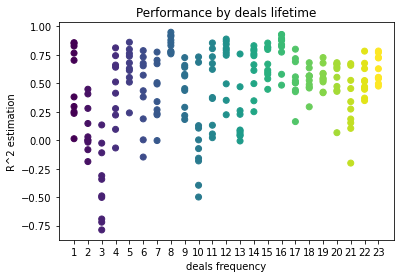

Start analysis  22 h
Iteration:  0 R^2:  -0.36563942234773883  hour=  22  deal lifetime =  1
Iteration:  1 R^2:  -0.08365608008023095  hour=  22  deal lifetime =  1
Iteration:  2 R^2:  -0.2212783462801745  hour=  22  deal lifetime =  1
Iteration:  3 R^2:  -0.570640055650861  hour=  22  deal lifetime =  1
Iteration:  4 R^2:  -0.6345435065069736  hour=  22  deal lifetime =  1
Iteration:  5 R^2:  -0.3120427823458094  hour=  22  deal lifetime =  1
Iteration:  6 R^2:  -0.599436386955013  hour=  22  deal lifetime =  1
Iteration:  7 R^2:  -0.20813006646700094  hour=  22  deal lifetime =  1
Iteration:  8 R^2:  -0.23894676569353068  hour=  22  deal lifetime =  1
Iteration:  9 R^2:  0.1993447926447025  hour=  22  deal lifetime =  1
Iteration:  0 R^2:  -0.12185116428742815  hour=  22  deal lifetime =  2
Iteration:  1 R^2:  -0.07336987890428115  hour=  22  deal lifetime =  2
Iteration:  2 R^2:  -0.4553370353033102  hour=  22  deal lifetime =  2
Iteration:  3 R^2:  -0.9000821382299705  hour=  22  d

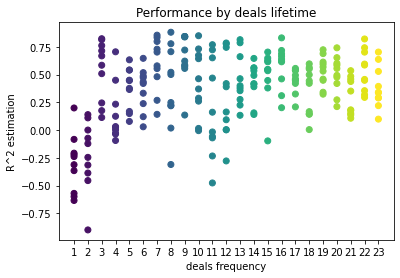

Start analysis  23 h
Iteration:  0 R^2:  0.061673130496286636  hour=  23  deal lifetime =  1
Iteration:  1 R^2:  0.6264872016520622  hour=  23  deal lifetime =  1
Iteration:  2 R^2:  -0.03719568876606161  hour=  23  deal lifetime =  1
Iteration:  3 R^2:  -0.19162668584354794  hour=  23  deal lifetime =  1
Iteration:  4 R^2:  -0.20441424819238552  hour=  23  deal lifetime =  1
Iteration:  5 R^2:  0.05433135368274422  hour=  23  deal lifetime =  1
Iteration:  6 R^2:  -0.18840828531347986  hour=  23  deal lifetime =  1
Iteration:  7 R^2:  0.29925125382142537  hour=  23  deal lifetime =  1
Iteration:  8 R^2:  0.32170158659816317  hour=  23  deal lifetime =  1
Iteration:  9 R^2:  -0.0036638833008441063  hour=  23  deal lifetime =  1
Iteration:  0 R^2:  0.47299450704971774  hour=  23  deal lifetime =  2
Iteration:  1 R^2:  0.5302462419634035  hour=  23  deal lifetime =  2
Iteration:  2 R^2:  0.29751313752324715  hour=  23  deal lifetime =  2
Iteration:  3 R^2:  0.513376664526227  hour=  23  

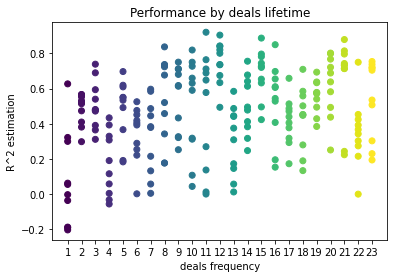

In [22]:
r = deals_frequency_analyzer()

In [29]:
#18 - 17
#21 - 8
#2  - 8
#17 - 11
#17 - 13 (best)
def get_report(model):
    return model[2]

def export_model_to_MQL_code(model, name):
    model.save_model('catmodel_'+name+ '.h',
    format="cpp",
    export_parameters=None,
    pool=None)

    # add variables
    code = 'int hnd[];\n'
    code += 'int OnInit() {\n'
    code +=     'ArrayResize(hnd,' + str(len(MA_PERIODS)) + ');\n'

    count = len(MA_PERIODS) - 1
    for i in MA_PERIODS:
        code +=     'hnd[' + str(count) + ']' + ' =' + ' iMA(NULL,PERIOD_CURRENT,' + str(i) + ',0,MODE_SMA,PRICE_CLOSE);\n'
        count -= 1

    code += 'return(INIT_SUCCEEDED);\n'
    code += '}\n\n'

    # get features
    code += 'void fill_arays(double &features[]) {\n'
    code += '   double ma[], pr[], ret[];\n'
    code += '   ArrayResize(ret,' + str(len(MA_PERIODS)) +');\n'
    code += '   CopyClose(NULL,PERIOD_CURRENT,1,1,pr);\n'
    code += '   for(int i=0;i<' + str(len(MA_PERIODS)) +';i++) {\n'
    code += '       CopyBuffer(hnd[' + 'i' + '], 0, 1, 1, ma);\n'
    code += '       ret[i] = pr[0] - ma[0];\n }\n'
    code += '   ArrayInsert(features, ret, ArraySize(features), 0, WHOLE_ARRAY);'
    code += '   ArraySetAsSeries(features, true);\n'
    code += '}\n\n'

    # add CatBosst
    code += 'double catboost_model' + '(const double &features[]) { \n'
    code += '    '
    with open('catmodel_'+name+ '.h', 'r') as file:
        data = file.read()
        code += data[data.find("unsigned int TreeDepth"):data.find("double Scale = 1;")]
    code +='\n\n'
    code+= 'return ' + 'ApplyCatboostModel(features, TreeDepth, TreeSplits , BorderCounts, Borders, LeafValues); } \n\n'

    code += 'double ApplyCatboostModel(const double &features[],uint &TreeDepth_[],uint &TreeSplits_[],uint &BorderCounts_[],float &Borders_[],double &LeafValues_[]) {\n\
    uint FloatFeatureCount=ArrayRange(BorderCounts_,0);\n\
    uint BinaryFeatureCount=ArrayRange(Borders_,0);\n\
    uint TreeCount=ArrayRange(TreeDepth_,0);\n\
    bool     binaryFeatures[];\n\
    ArrayResize(binaryFeatures,BinaryFeatureCount);\n\
    uint binFeatureIndex=0;\n\
    for(uint i=0; i<FloatFeatureCount; i++) {\n\
       for(uint j=0; j<BorderCounts_[i]; j++) {\n\
          binaryFeatures[binFeatureIndex]=features[i]>Borders_[binFeatureIndex];\n\
          binFeatureIndex++;\n\
       }\n\
    }\n\
    double result=0.0;\n\
    uint treeSplitsPtr=0;\n\
    uint leafValuesForCurrentTreePtr=0;\n\
    for(uint treeId=0; treeId<TreeCount; treeId++) {\n\
       uint currentTreeDepth=TreeDepth_[treeId];\n\
       uint index=0;\n\
       for(uint depth=0; depth<currentTreeDepth; depth++) {\n\
          index|=(binaryFeatures[TreeSplits_[treeSplitsPtr+depth]]<<depth);\n\
       }\n\
       result+=LeafValues_[leafValuesForCurrentTreePtr+index];\n\
       treeSplitsPtr+=currentTreeDepth;\n\
       leafValuesForCurrentTreePtr+=(1<<currentTreeDepth);\n\
    }\n\
    return 1.0/(1.0+MathPow(M_E,-result));\n\
    }'

    file = open('./' + 'catmodel_'+name+ '.mqh', "w")
    file.write(code)
    file.close()
    print('The file ' + 'cat_model' + '.mqh ' + 'has been written to disc')

# make dataset
def final_test_model(_h, loop=20):
  pr = v2get_prices()
  pr = add_labels(pr, min=_h, max=_h, filter=time_filter)
  tester(pr, MARKUP, plot=True, filter=time_filter)

  # perform GMM clasterizatin over dataset
  # gmm = mixture.BayesianGaussianMixture(n_components=n_compnents, covariance_type='full').fit(X)
  gmm = mixture.GaussianMixture(
      n_components=n_compnents, covariance_type='full', n_init=1).fit(pr[pr.columns[1:]])

  # iterative learning
  res = []
  model_score = []
  for i in range(loop):
      res.append(brute_force(10000, gmm))
      print('Iteration: ', i, 'R^2: ', res[-1][0])
      test_model(res[-1], plot=True)

  print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
  # test best model
  res.sort()
  print("Best model score:", res[-1][0], ' report score:', res[-1][2])
  test_model(res[-1], plot=True)
  export_model_to_MQL_code(res[-1][1], 'best_model_eurusd_' + str(hours[0]) + 'h_keep_' + str(_h) + 'h')

  res.sort(key=get_report)
  print("Best report score:", res[-1][2], ' model score:', res[-1][0])
  test_model(res[-1], plot=True)
  export_model_to_MQL_code(res[-1][1], 'best_score_eurusd_' + str(hours[0]) + 'h_keep_' + str(_h) + 'h')
  print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")

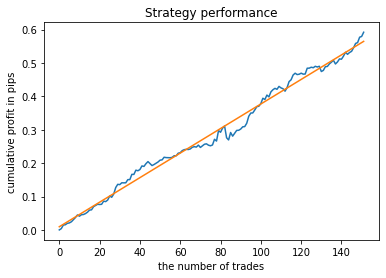

Iteration:  0 R^2:  0.9239331845282445


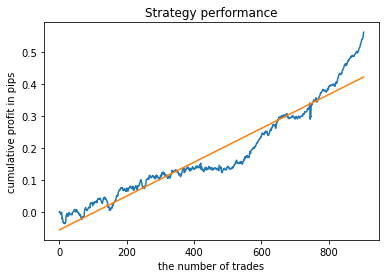

Score: 0.562800000000006
Iteration:  1 R^2:  0.8325675173736924


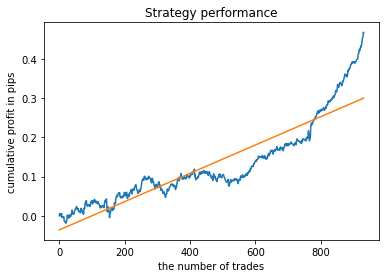

Score: 0.46747000000000966
Iteration:  2 R^2:  0.9514072717982658


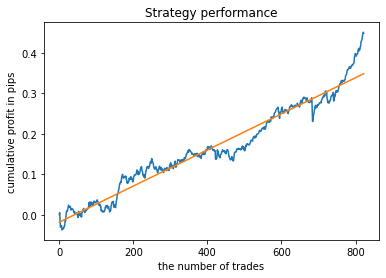

Score: 0.4508600000000081
Iteration:  3 R^2:  0.8408974060844935


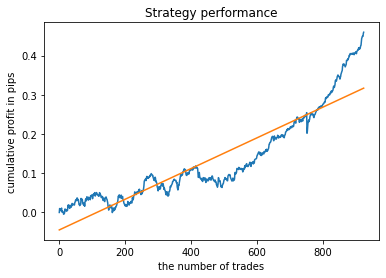

Score: 0.4594200000000085
Iteration:  4 R^2:  0.9095701110415391


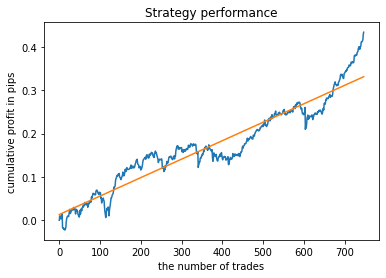

Score: 0.43383000000000843
Iteration:  5 R^2:  0.8949564323491925


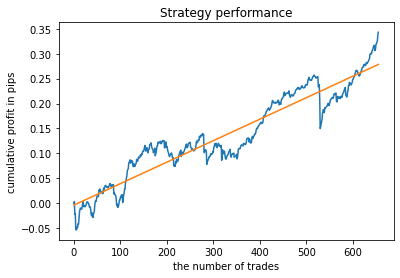

Score: 0.3433800000000066
Iteration:  6 R^2:  0.9141832051101825


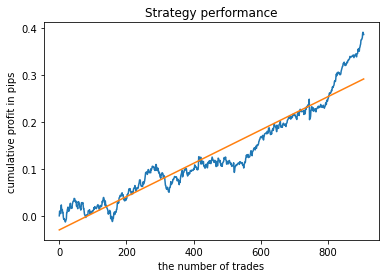

Score: 0.3904600000000084
Iteration:  7 R^2:  0.7546740377811594


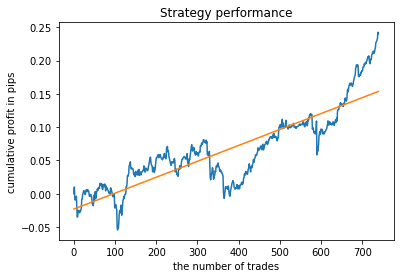

Score: 0.24243999999999843
Iteration:  8 R^2:  0.790113269171223


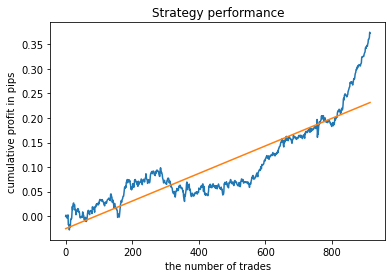

Score: 0.3749500000000093
Iteration:  9 R^2:  0.809489360385929


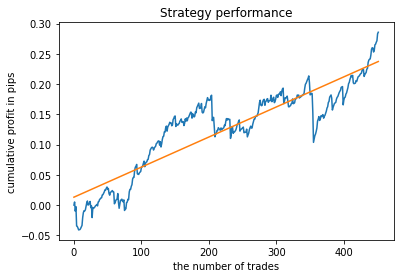

Score: 0.28560000000000596
Iteration:  10 R^2:  0.9017064430615325


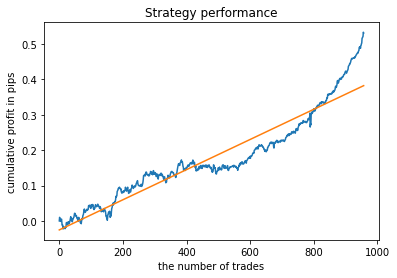

Score: 0.5331900000000082
Iteration:  11 R^2:  0.9284105495444396


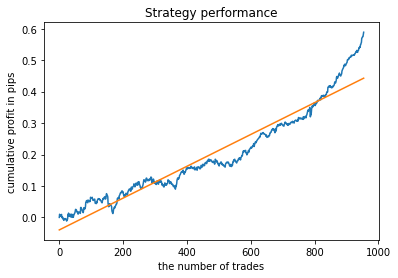

Score: 0.5888000000000106
Iteration:  12 R^2:  0.9430501094463307


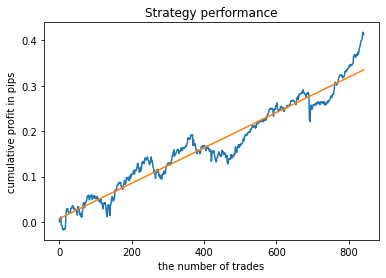

Score: 0.4180300000000098
Iteration:  13 R^2:  0.8422125368456548


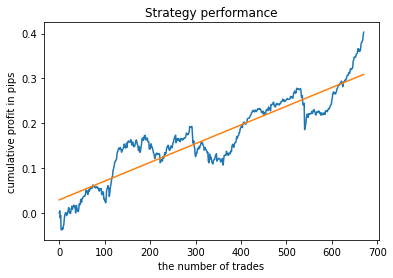

Score: 0.4029300000000116
Iteration:  14 R^2:  0.8650555479427597


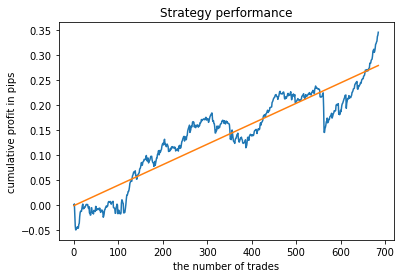

Score: 0.34603000000001094
Iteration:  15 R^2:  0.9065338250709002


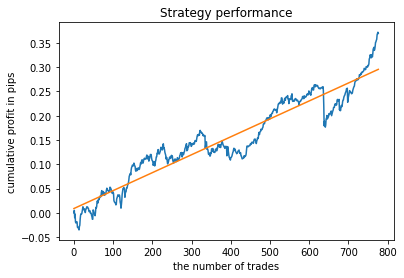

Score: 0.37172000000001015
Iteration:  16 R^2:  0.9204072631649031


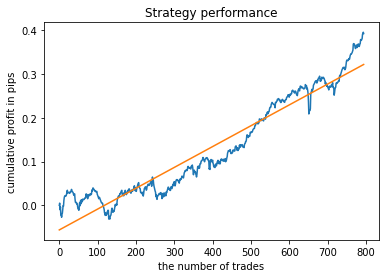

Score: 0.3951200000000078
Iteration:  17 R^2:  0.9520433714094867


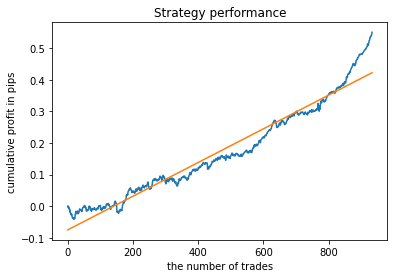

Score: 0.5499500000000117
Iteration:  18 R^2:  0.8936593960536898


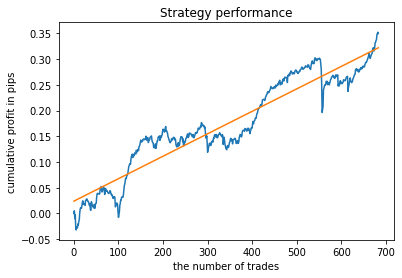

Score: 0.35201000000001204
Iteration:  19 R^2:  0.9263172993356821


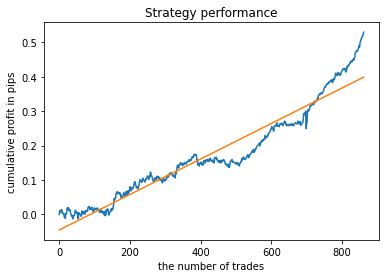

Score: 0.5292200000000072
Iteration:  20 R^2:  0.9090960492422


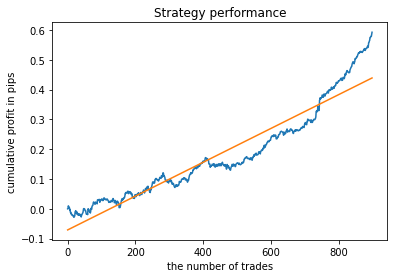

Score: 0.592420000000011
Iteration:  21 R^2:  0.9233921760107298


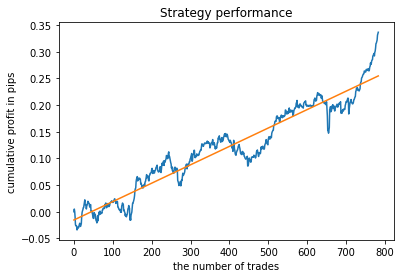

Score: 0.33669000000000804
Iteration:  22 R^2:  0.9585856832029158


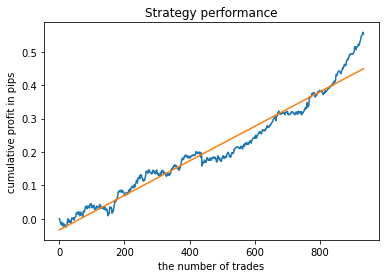

Score: 0.5585300000000072
Iteration:  23 R^2:  0.8467741424302161


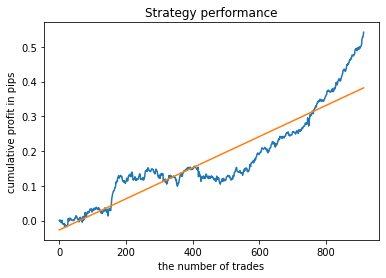

Score: 0.5421400000000116
Iteration:  24 R^2:  0.9422008300083041


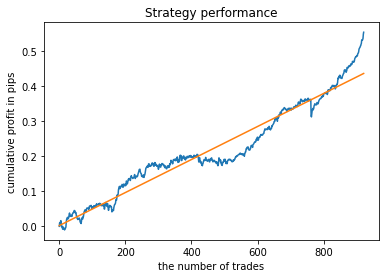

Score: 0.5548900000000139
Iteration:  25 R^2:  0.9401371363804558


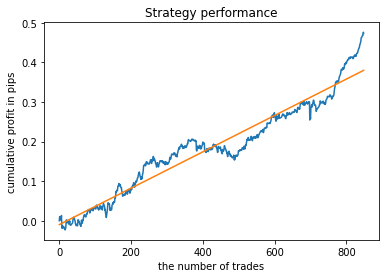

Score: 0.47616000000001146
Iteration:  26 R^2:  0.9120008378048605


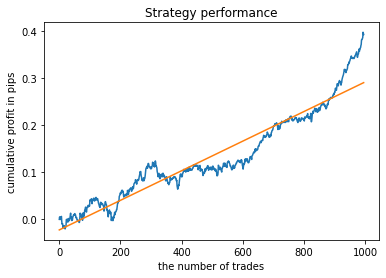

Score: 0.3982200000000078
Iteration:  27 R^2:  0.8321524658284485


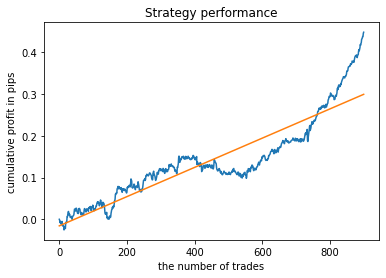

Score: 0.448070000000011
Iteration:  28 R^2:  0.9055918361059031


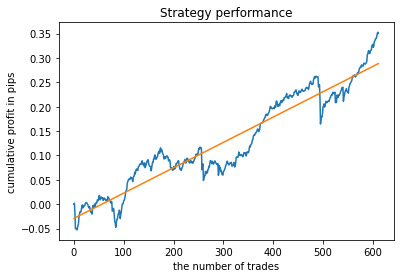

Score: 0.35269000000000794
Iteration:  29 R^2:  0.9355725683677365


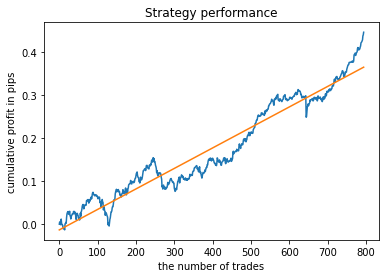

Score: 0.4462500000000083
Iteration:  30 R^2:  0.8741335487710581


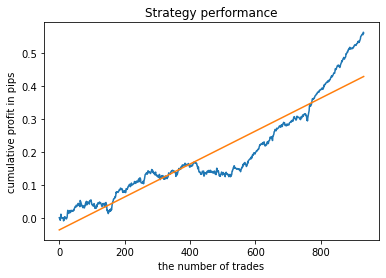

Score: 0.5636000000000057
Iteration:  31 R^2:  0.8600434199567832


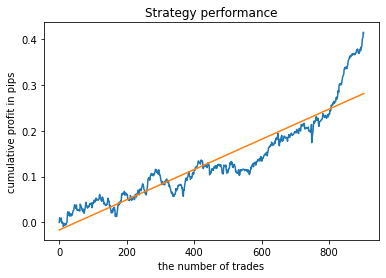

Score: 0.41497000000000644
Iteration:  32 R^2:  0.9107965112343499


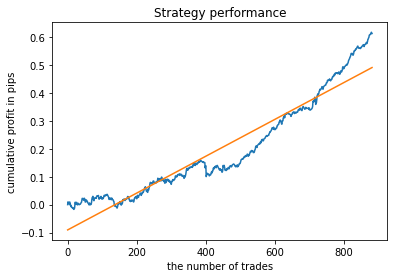

Score: 0.6169300000000075
Iteration:  33 R^2:  0.8825890833342783


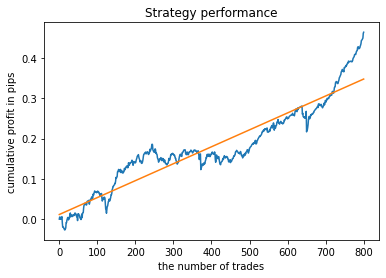

Score: 0.46382000000000995
Iteration:  34 R^2:  0.8042384819530715


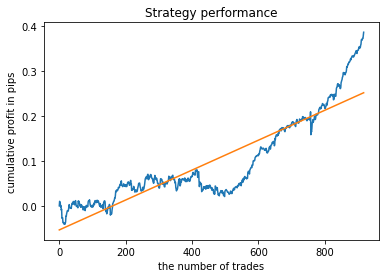

Score: 0.38667000000000745
Iteration:  35 R^2:  0.8395513728299969


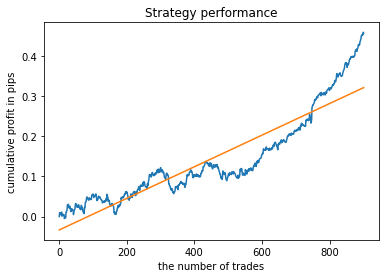

Score: 0.4597400000000079
Iteration:  36 R^2:  0.9257091563563323


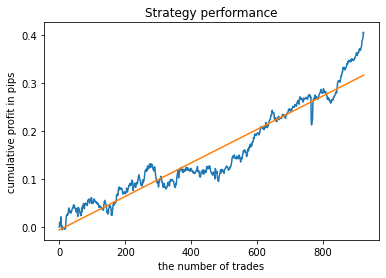

Score: 0.406670000000006
Iteration:  37 R^2:  0.3752327377271967


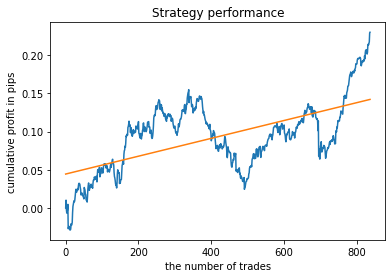

Score: 0.2303100000000031
Iteration:  38 R^2:  0.8900116308117998


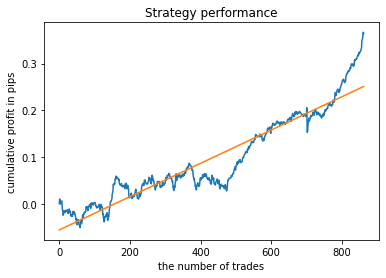

Score: 0.366980000000008
Iteration:  39 R^2:  0.8568781053975782


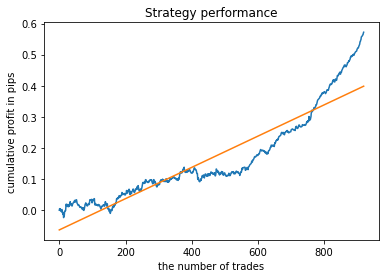

Score: 0.5719200000000084
Iteration:  40 R^2:  0.9324792215543111


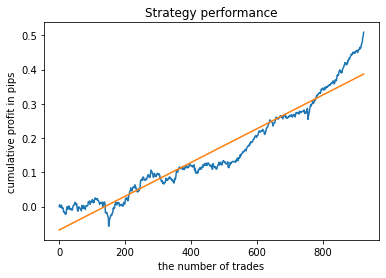

Score: 0.5088000000000126
Iteration:  41 R^2:  0.8456626002405241


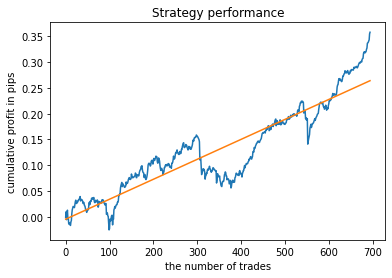

Score: 0.3576200000000066
Iteration:  42 R^2:  0.8027170799162693


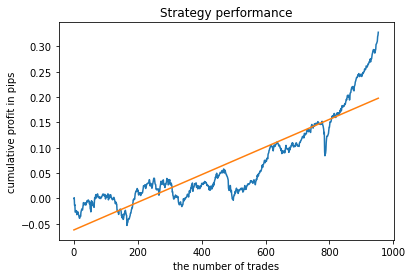

Score: 0.32797000000001003
Iteration:  43 R^2:  0.8928647855006683


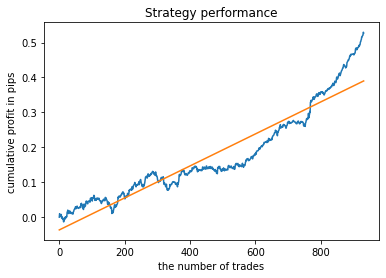

Score: 0.5295200000000082
Iteration:  44 R^2:  0.7948946120981952


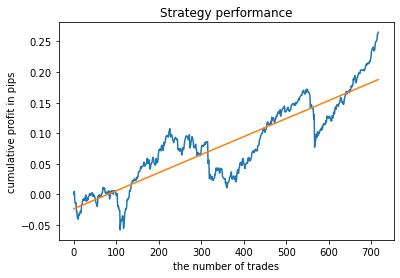

Score: 0.26507000000000946
Iteration:  45 R^2:  0.9162320330872316


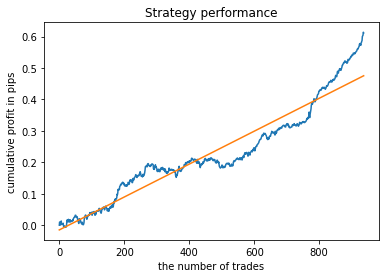

Score: 0.6136600000000131
Iteration:  46 R^2:  0.9342066055999515


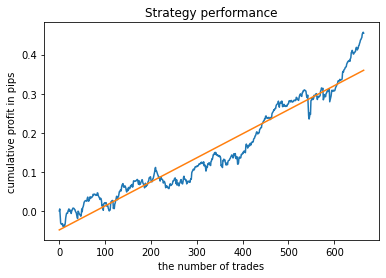

Score: 0.457290000000005
Iteration:  47 R^2:  0.9160801392766107


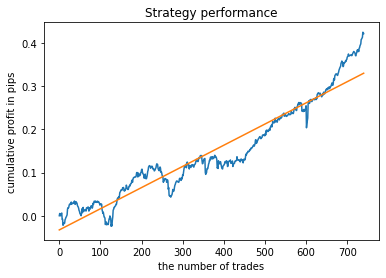

Score: 0.42533000000000676
Iteration:  48 R^2:  0.9659384855027404


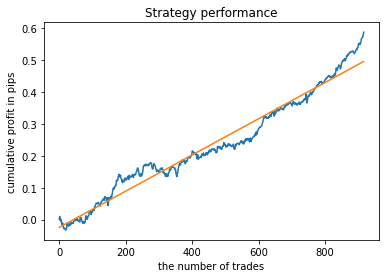

Score: 0.5871800000000151
Iteration:  49 R^2:  0.783988582418275


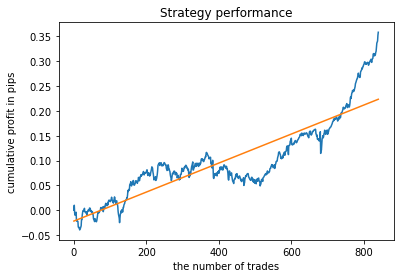

Score: 0.3584600000000057
Iteration:  50 R^2:  0.9312729366197277


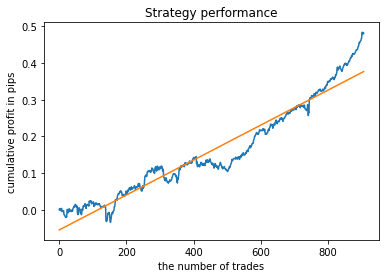

Score: 0.4840800000000104
Iteration:  51 R^2:  0.9233013023983828


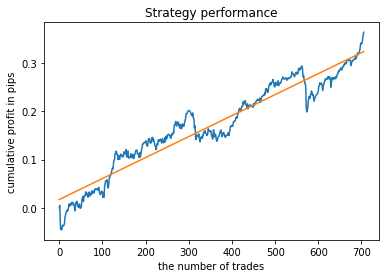

Score: 0.3636700000000077
Iteration:  52 R^2:  0.8539203884149056


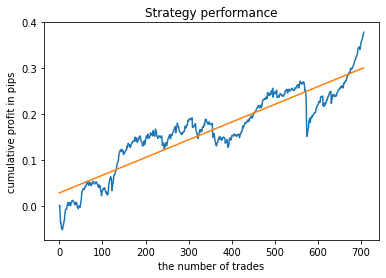

Score: 0.37850000000001005
Iteration:  53 R^2:  0.8170484746035901


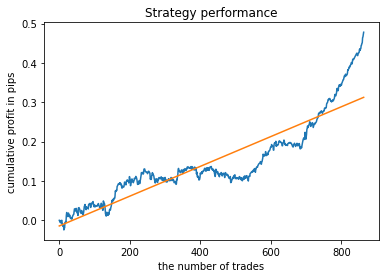

Score: 0.4780500000000058
Iteration:  54 R^2:  0.8122455021819728


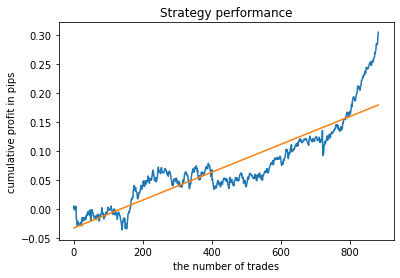

Score: 0.30502000000000373
Iteration:  55 R^2:  0.9003021660849722


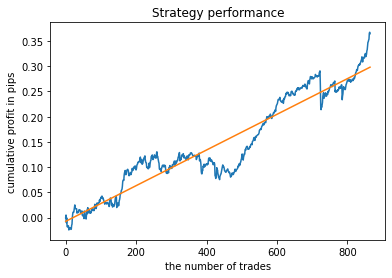

Score: 0.36745000000000827
Iteration:  56 R^2:  0.8493965761617968


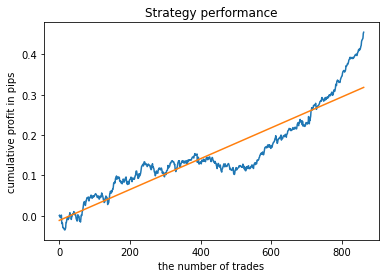

Score: 0.45520000000000854
Iteration:  57 R^2:  0.6076694986934769


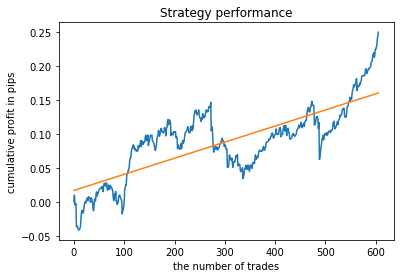

Score: 0.24986999999999981
Iteration:  58 R^2:  0.9135668347457986


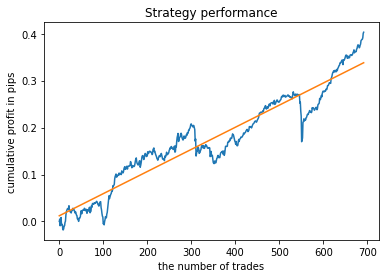

Score: 0.40304000000001095
Iteration:  59 R^2:  0.9096661254541726


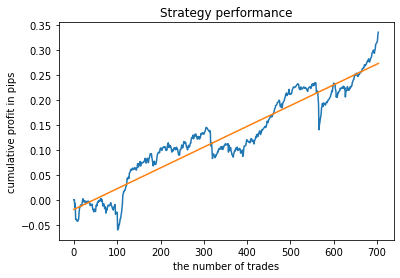

Score: 0.3360200000000061
Iteration:  60 R^2:  0.8980186024134451


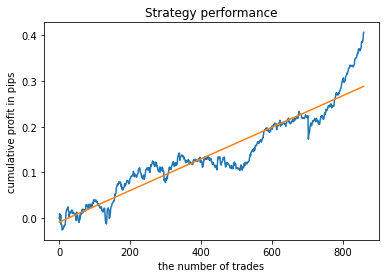

Score: 0.40635000000000643
Iteration:  61 R^2:  0.8394549840470863


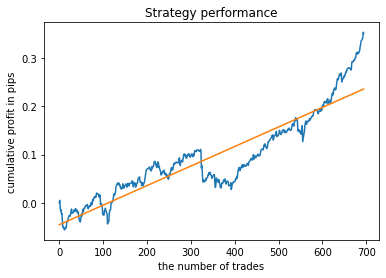

Score: 0.3535800000000049
Iteration:  62 R^2:  0.7415011197779399


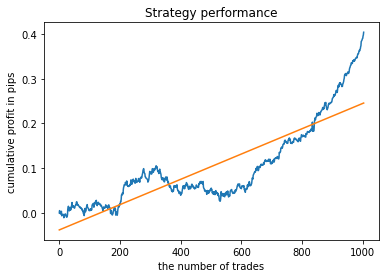

Score: 0.40415000000000756
Iteration:  63 R^2:  0.8593547157651824


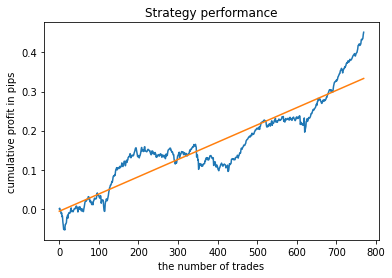

Score: 0.4517800000000099
Iteration:  64 R^2:  0.8542801062408275


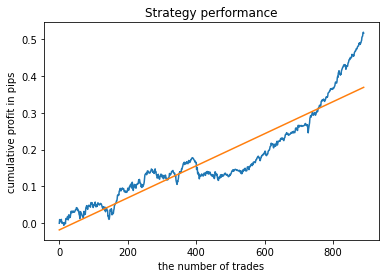

Score: 0.518160000000013
Iteration:  65 R^2:  0.8880626309146186


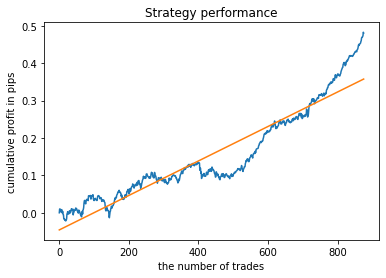

Score: 0.48302000000000267
Iteration:  66 R^2:  0.8406869156122161


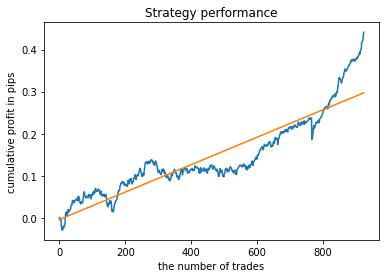

Score: 0.44101000000000756
Iteration:  67 R^2:  0.7893436566146567


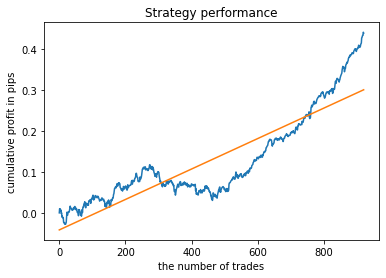

Score: 0.4401900000000116
Iteration:  68 R^2:  0.8675751883488634


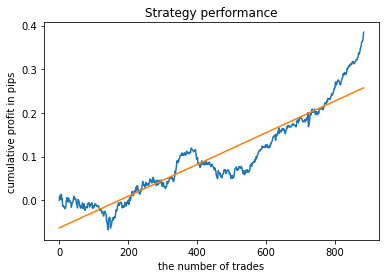

Score: 0.3845900000000091
Iteration:  69 R^2:  0.9062972329383404


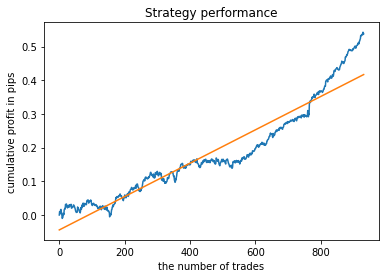

Score: 0.5424400000000096
Iteration:  70 R^2:  0.8709883598092898


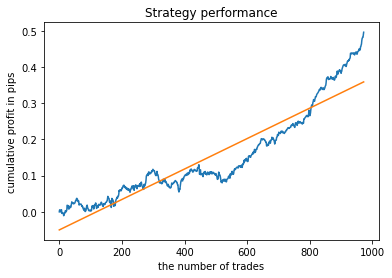

Score: 0.49629000000000534
Iteration:  71 R^2:  0.9148795291894282


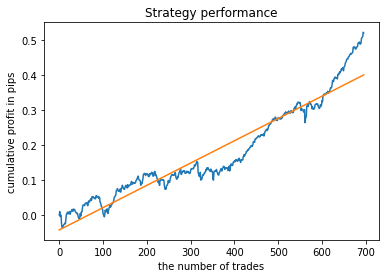

Score: 0.523370000000007
Iteration:  72 R^2:  0.7699427595131004


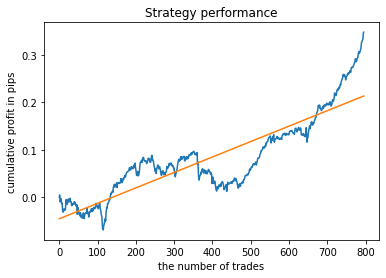

Score: 0.34802000000000777
Iteration:  73 R^2:  0.8252265562313553


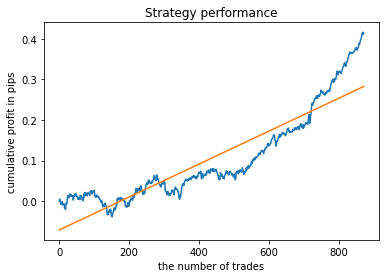

Score: 0.41607000000000915
Iteration:  74 R^2:  0.9362490009243365


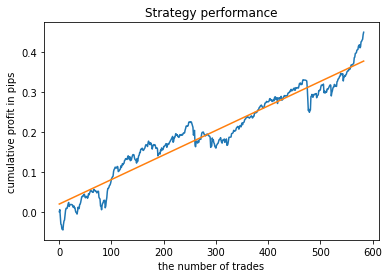

Score: 0.4486400000000119
Iteration:  75 R^2:  0.9603885007936737


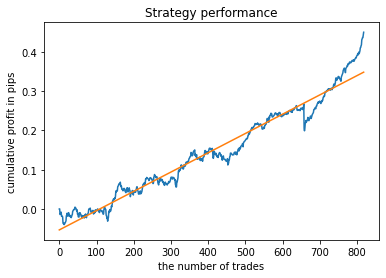

Score: 0.45028000000001034
Iteration:  76 R^2:  0.9257392343507121


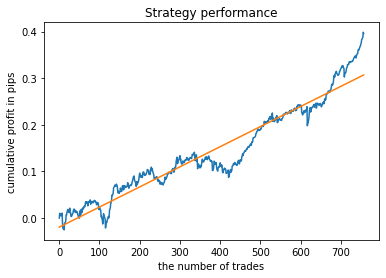

Score: 0.39873000000000874
Iteration:  77 R^2:  0.8257447407013441


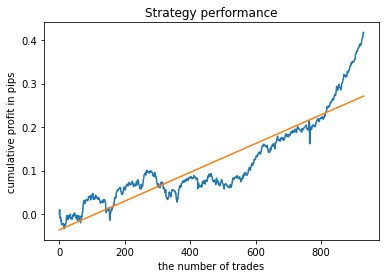

Score: 0.4182100000000061
Iteration:  78 R^2:  0.9097745145072907


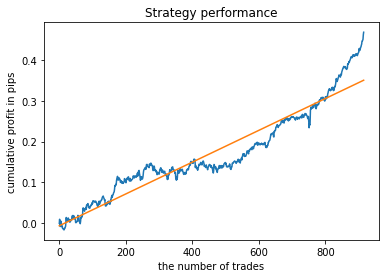

Score: 0.4676300000000088
Iteration:  79 R^2:  0.8958542625126131


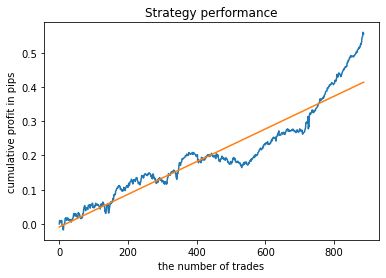

Score: 0.5597800000000086
Iteration:  80 R^2:  0.9092634773492795


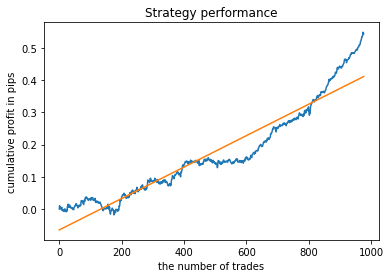

Score: 0.5492200000000091
Iteration:  81 R^2:  0.9358344053687971


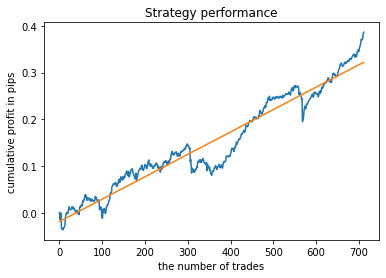

Score: 0.3862800000000072
Iteration:  82 R^2:  0.870118614862734


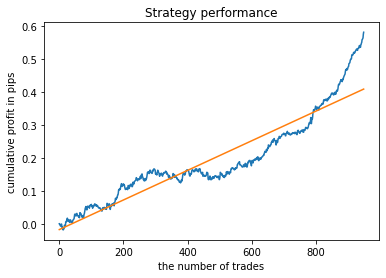

Score: 0.5813100000000092
Iteration:  83 R^2:  0.8660548342494726


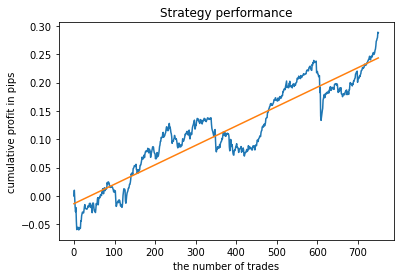

Score: 0.2887000000000043
Iteration:  84 R^2:  0.934459172549313


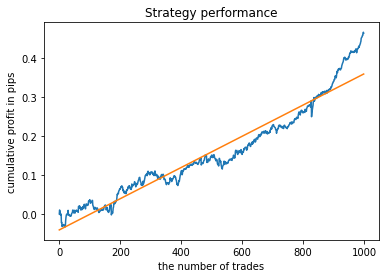

Score: 0.46523000000001197
Iteration:  85 R^2:  0.7780560420848528


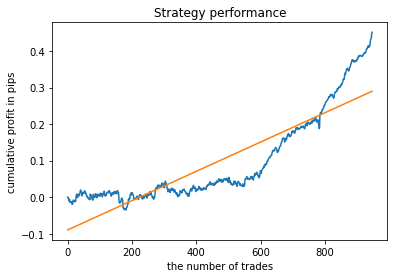

Score: 0.45138000000000966
Iteration:  86 R^2:  0.9051684551512925


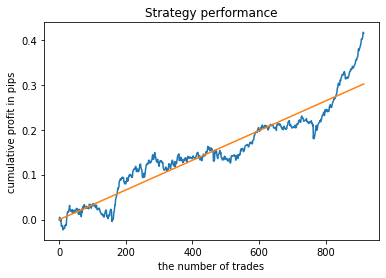

Score: 0.417040000000011
Iteration:  87 R^2:  0.8772942928760054


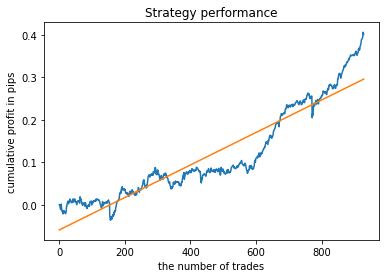

Score: 0.4058400000000074
Iteration:  88 R^2:  0.8886632202680926


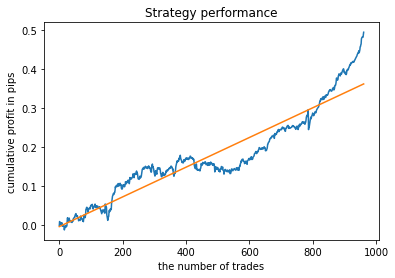

Score: 0.4943100000000118
Iteration:  89 R^2:  0.9542452109640895


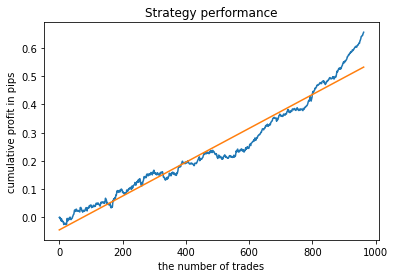

Score: 0.65550000000001
Iteration:  90 R^2:  0.8164221135031249


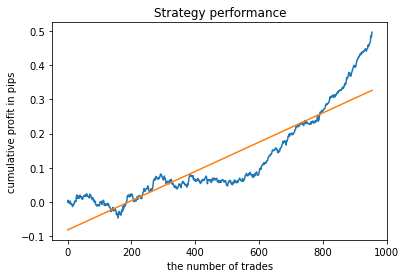

Score: 0.4961500000000074
Iteration:  91 R^2:  0.8504654545391249


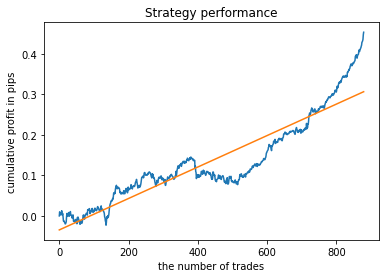

Score: 0.4537200000000038
Iteration:  92 R^2:  0.7827238631019966


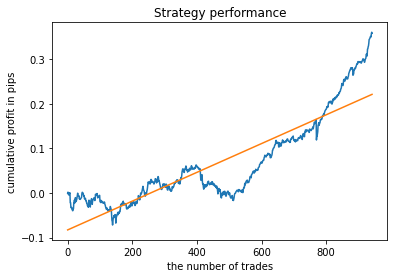

Score: 0.3608600000000031
Iteration:  93 R^2:  0.8637332315270675


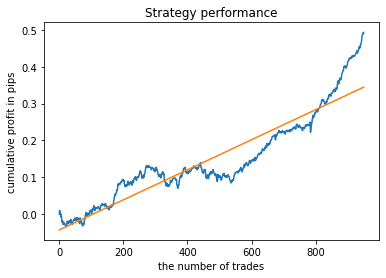

Score: 0.4934500000000057
Iteration:  94 R^2:  0.8755541600717525


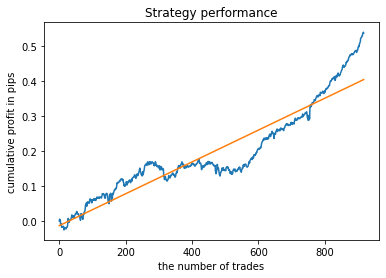

Score: 0.5397400000000132
Iteration:  95 R^2:  0.7318400451114452


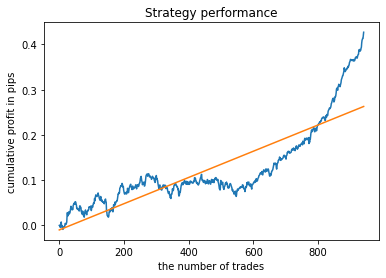

Score: 0.42698000000000513
Iteration:  96 R^2:  0.8916519354245792


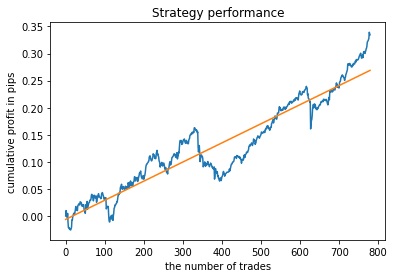

Score: 0.3393300000000058
Iteration:  97 R^2:  0.8886130560120999


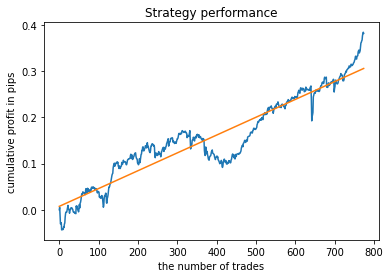

Score: 0.3846600000000067
Iteration:  98 R^2:  0.8744952023749625


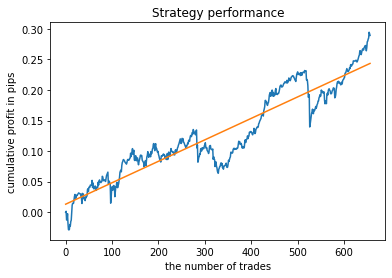

Score: 0.29462000000000366
Iteration:  99 R^2:  0.867880967952668


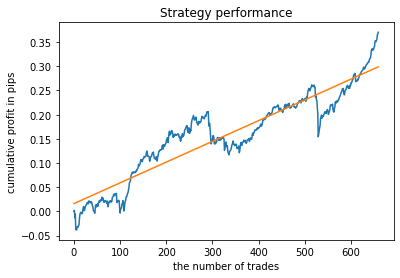

Score: 0.37040000000001083
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Best model score: 0.9659384855027404  report score: 0.5871800000000151


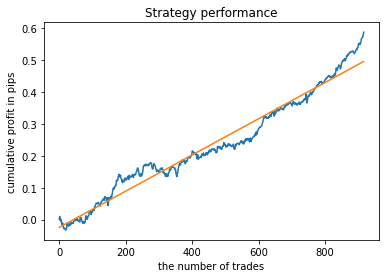

Score: 0.5871800000000151
The file cat_model.mqh has been written to disc
Best report score: 0.65550000000001  model score: 0.9542452109640895


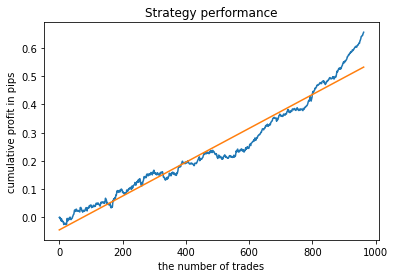

Score: 0.65550000000001
The file cat_model.mqh has been written to disc
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<


In [28]:
hours = [17]
final_test_model(13, 100)

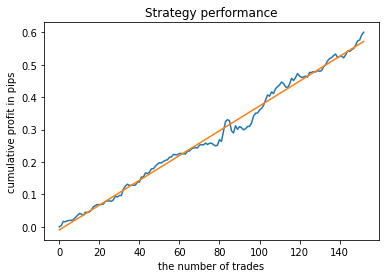

Iteration:  0 R^2:  0.6757296426283781


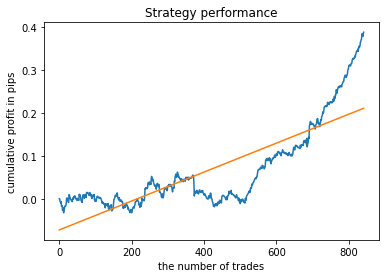

Score: 0.38868000000000513
Iteration:  1 R^2:  0.7550505588511748


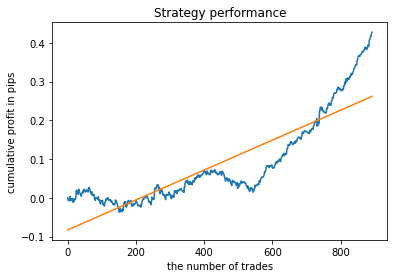

Score: 0.42757000000000756
Iteration:  2 R^2:  0.8001073766398893


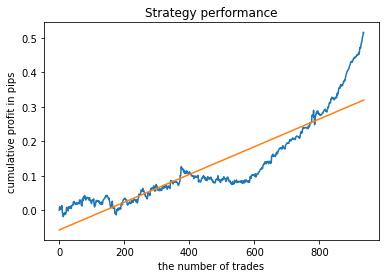

Score: 0.5161100000000056
Iteration:  3 R^2:  0.7192010415929263


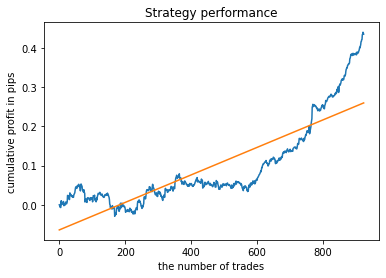

Score: 0.44012000000000373
Iteration:  4 R^2:  0.8740967173644032


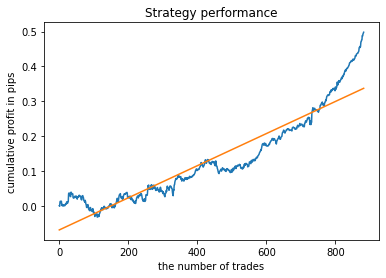

Score: 0.4980900000000054
Iteration:  5 R^2:  0.7993538776233576


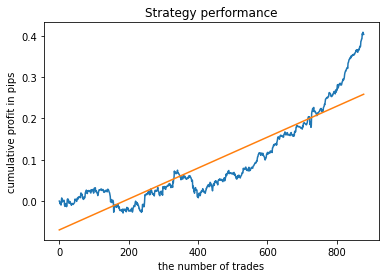

Score: 0.4085400000000058
Iteration:  6 R^2:  0.7349754050827377


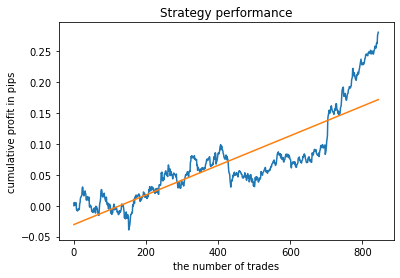

Score: 0.280349999999998
Iteration:  7 R^2:  0.6202459882996145


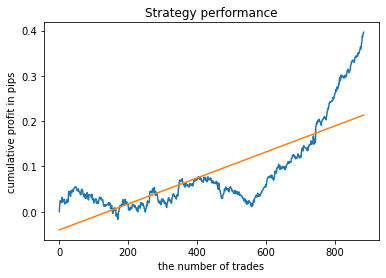

Score: 0.39644000000000246
Iteration:  8 R^2:  0.8085352156559206


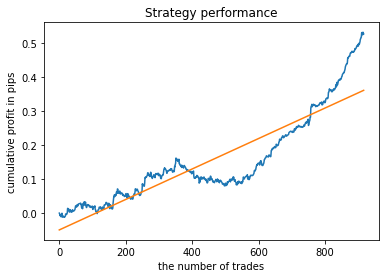

Score: 0.5326200000000082
Iteration:  9 R^2:  0.7233434957189638


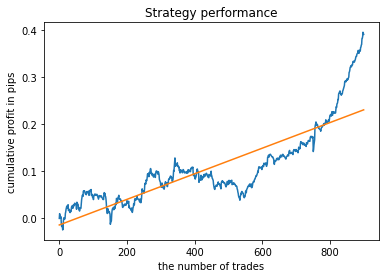

Score: 0.3945400000000076
Iteration:  10 R^2:  0.7388060856784326


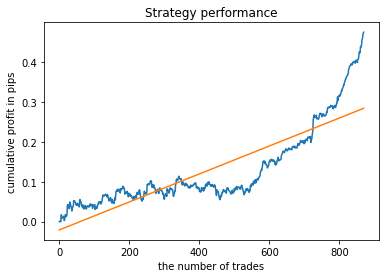

Score: 0.47516000000000436
Iteration:  11 R^2:  0.6359865866983896


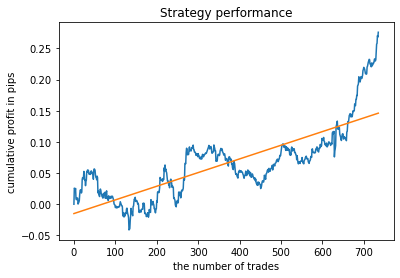

Score: 0.2760500000000054
Iteration:  12 R^2:  0.7530209860788089


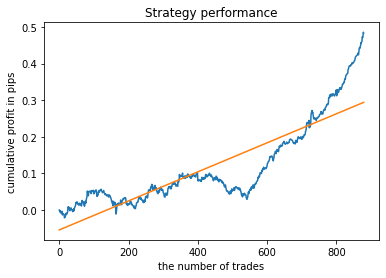

Score: 0.4856200000000088
Iteration:  13 R^2:  0.42628098276373505


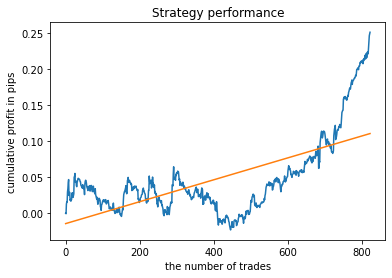

Score: 0.2511000000000041
Iteration:  14 R^2:  0.8347143873654832


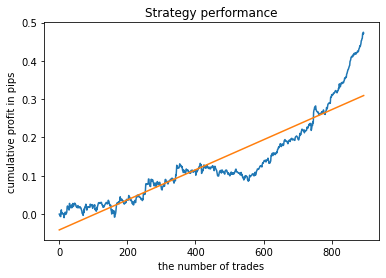

Score: 0.4745900000000042
Iteration:  15 R^2:  0.7380160059674283


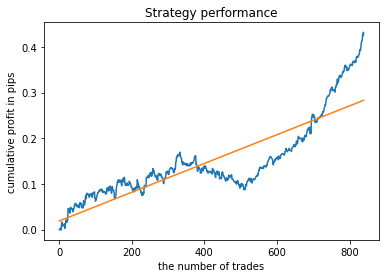

Score: 0.43220000000000847
Iteration:  16 R^2:  0.8133393268402804


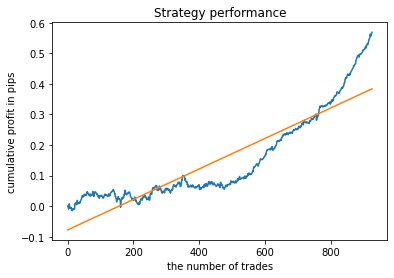

Score: 0.5689100000000072
Iteration:  17 R^2:  0.7948093217612112


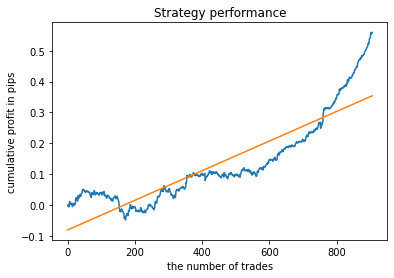

Score: 0.559670000000003
Iteration:  18 R^2:  0.5753202907226749


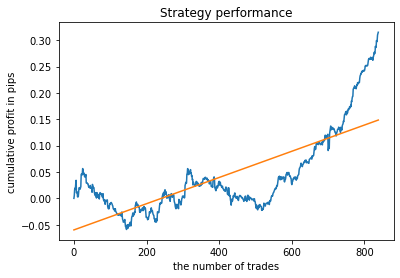

Score: 0.3150900000000031
Iteration:  19 R^2:  0.8717429415066675


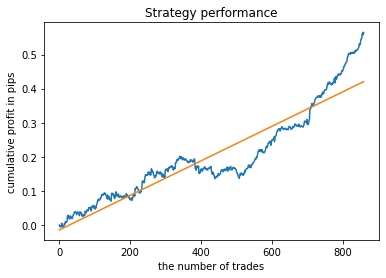

Score: 0.5653000000000135
Iteration:  20 R^2:  0.7217429221980054


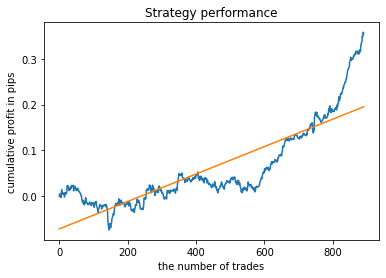

Score: 0.3577100000000037
Iteration:  21 R^2:  0.6157092203643961


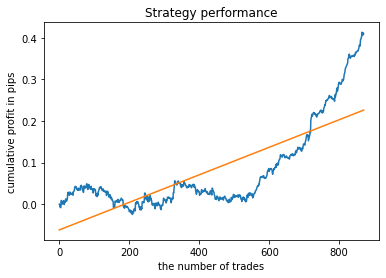

Score: 0.4136500000000044
Iteration:  22 R^2:  0.6784321842893313


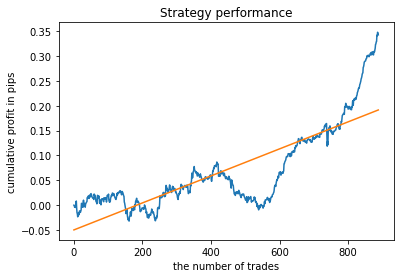

Score: 0.34805000000001113
Iteration:  23 R^2:  0.6707375074624288


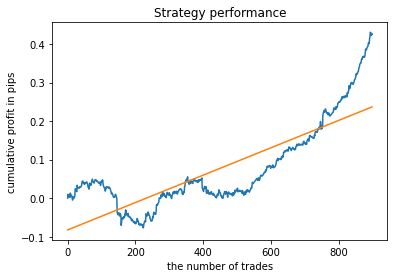

Score: 0.4304900000000076
Iteration:  24 R^2:  0.8044489834456944


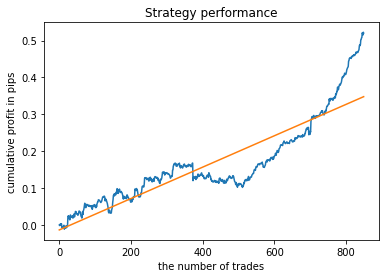

Score: 0.5226300000000098
Iteration:  25 R^2:  0.9014457547506363


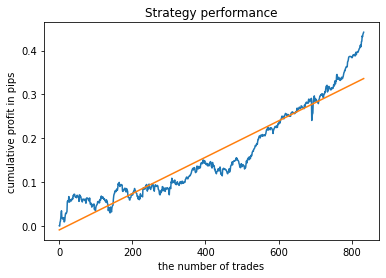

Score: 0.44184000000001067
Iteration:  26 R^2:  0.7001954047315725


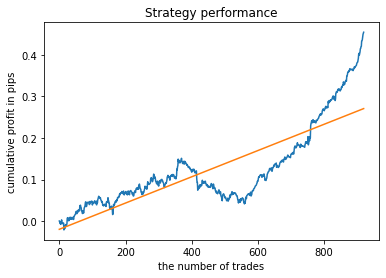

Score: 0.4547100000000107
Iteration:  27 R^2:  0.8812154308473935


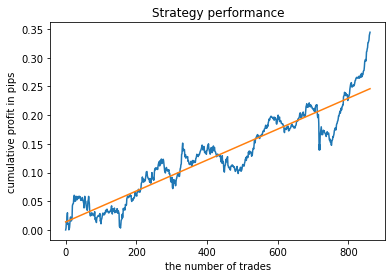

Score: 0.3444000000000085
Iteration:  28 R^2:  0.9073237661982452


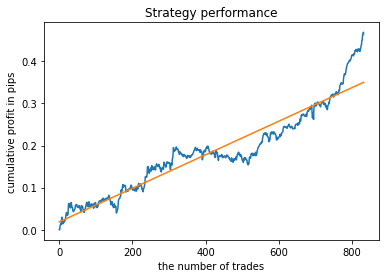

Score: 0.46921000000000757
Iteration:  29 R^2:  0.6969844225074704


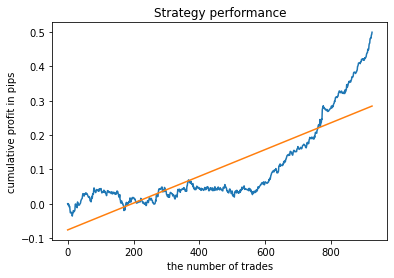

Score: 0.4993900000000099
Iteration:  30 R^2:  0.6947242819991881


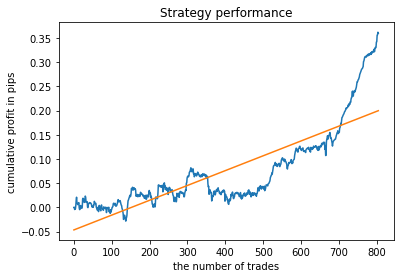

Score: 0.36212000000000333
Iteration:  31 R^2:  0.6973910309721334


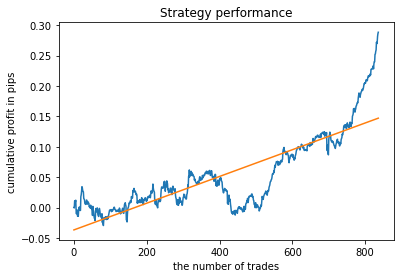

Score: 0.2883500000000034
Iteration:  32 R^2:  0.7983791535740582


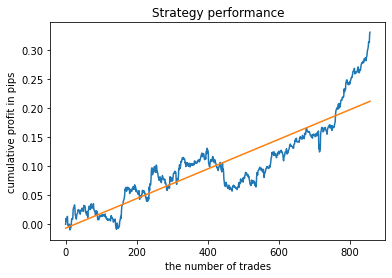

Score: 0.3309300000000053
Iteration:  33 R^2:  0.6815725296340007


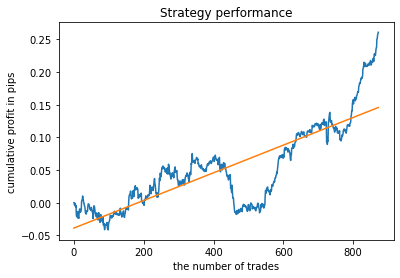

Score: 0.26110000000000105
Iteration:  34 R^2:  0.9061925702199315


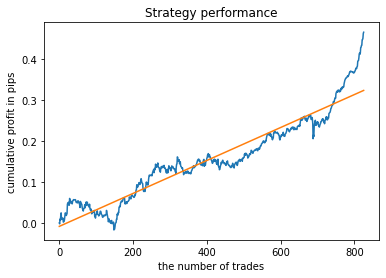

Score: 0.46464000000000616
Iteration:  35 R^2:  0.6869821344817993


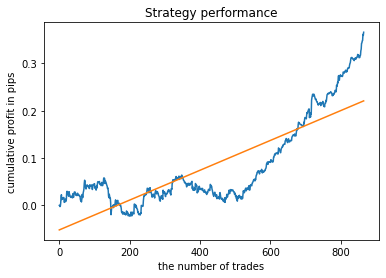

Score: 0.3661100000000056
Iteration:  36 R^2:  0.8201132970940289


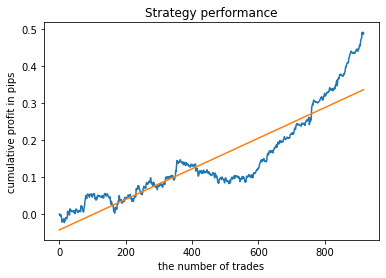

Score: 0.4916200000000103
Iteration:  37 R^2:  0.7253609869608627


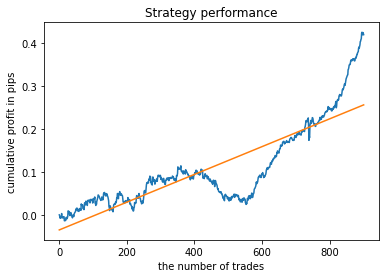

Score: 0.4242500000000091
Iteration:  38 R^2:  0.9390961018320354


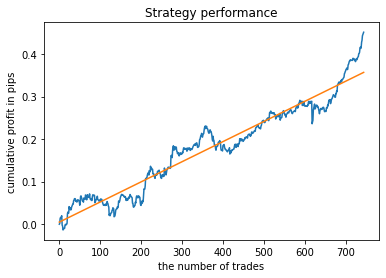

Score: 0.4510100000000072
Iteration:  39 R^2:  0.8721704154919069


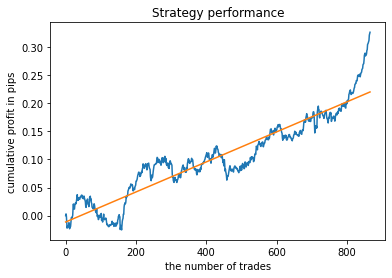

Score: 0.3268500000000101
Iteration:  40 R^2:  0.8344053719999636


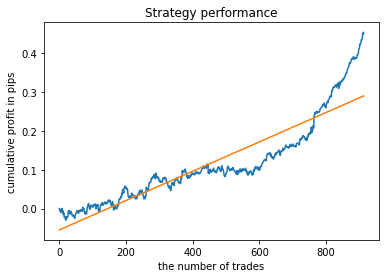

Score: 0.45379999999999876
Iteration:  41 R^2:  0.12721663625790658


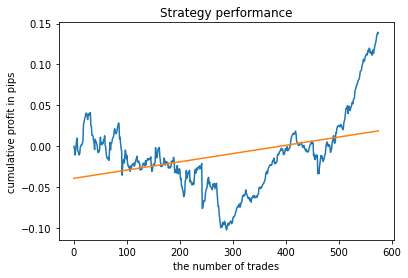

Score: 0.13934000000000032
Iteration:  42 R^2:  0.8295849457737954


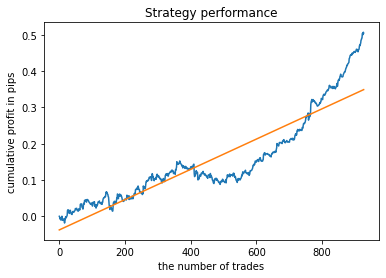

Score: 0.5070200000000098
Iteration:  43 R^2:  0.4546626558006307


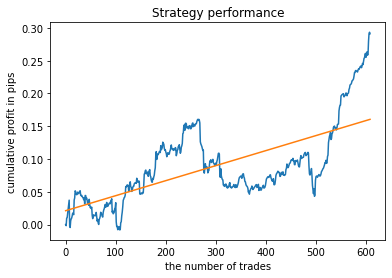

Score: 0.29345000000000343
Iteration:  44 R^2:  0.7607368837397984


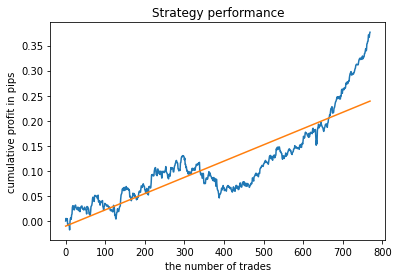

Score: 0.37656000000000484
Iteration:  45 R^2:  0.7251247786225942


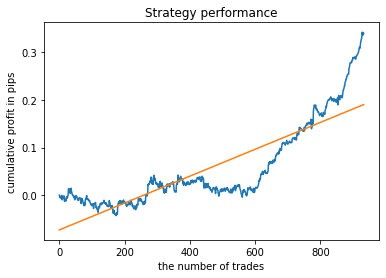

Score: 0.342440000000006
Iteration:  46 R^2:  0.8701608824913615


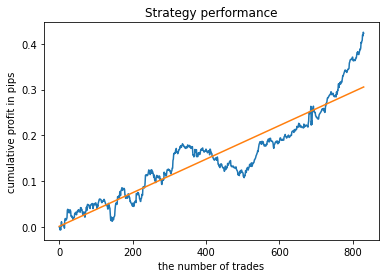

Score: 0.4251500000000073
Iteration:  47 R^2:  0.34649359711476724


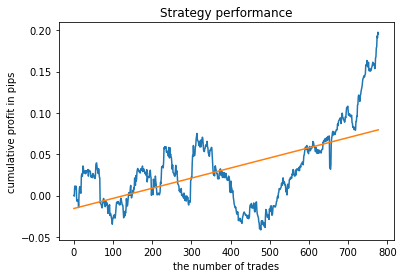

Score: 0.19753000000000376
Iteration:  48 R^2:  0.7234064438714876


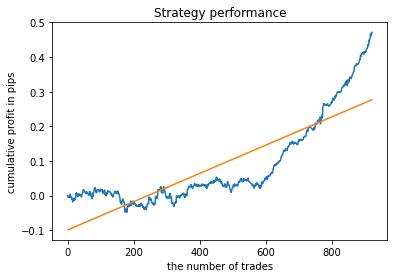

Score: 0.4718400000000071
Iteration:  49 R^2:  0.7360902544641402


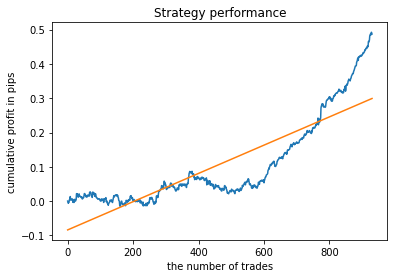

Score: 0.49234000000000244
Iteration:  50 R^2:  0.7836878161538493


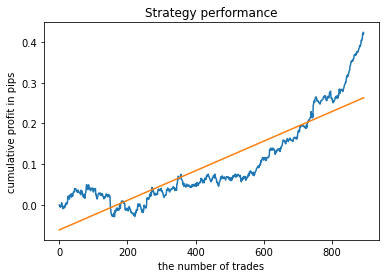

Score: 0.42366000000000437
Iteration:  51 R^2:  0.5443251089679729


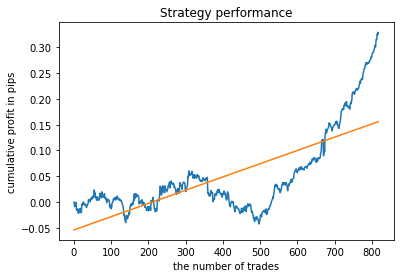

Score: 0.32903000000000293
Iteration:  52 R^2:  0.8806637531116316


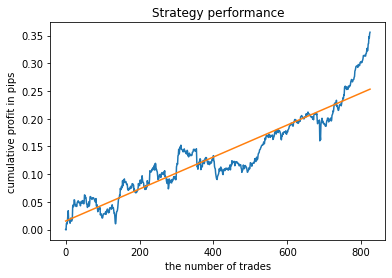

Score: 0.35606000000000876
Iteration:  53 R^2:  0.8889754948067593


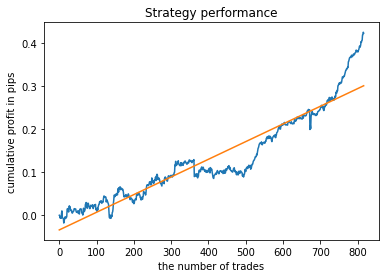

Score: 0.4250600000000034
Iteration:  54 R^2:  0.9150493242325262


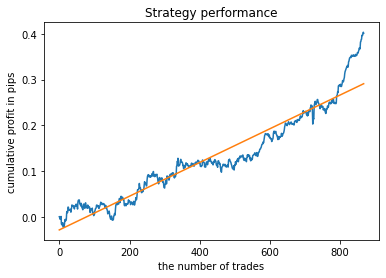

Score: 0.40374000000000854
Iteration:  55 R^2:  0.7150873051880132


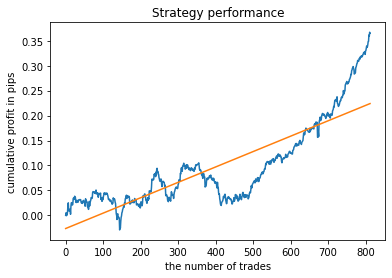

Score: 0.3670100000000056
Iteration:  56 R^2:  0.7836579746772393


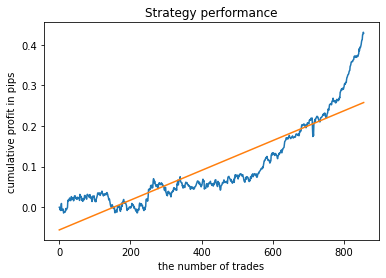

Score: 0.43084000000000633
Iteration:  57 R^2:  0.7829558686749637


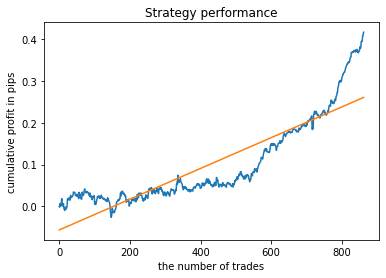

Score: 0.4164000000000049
Iteration:  58 R^2:  0.46122501961711354


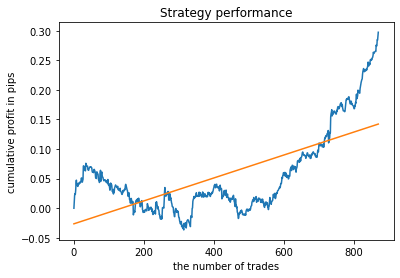

Score: 0.29741000000000106
Iteration:  59 R^2:  0.7669579648242206


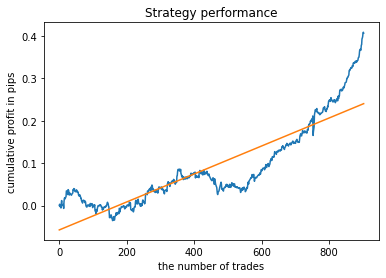

Score: 0.40885000000000354
Iteration:  60 R^2:  0.9071328934665361


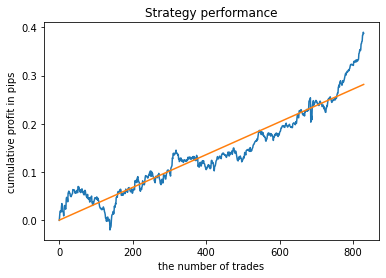

Score: 0.38971000000000594
Iteration:  61 R^2:  0.7408289495022017


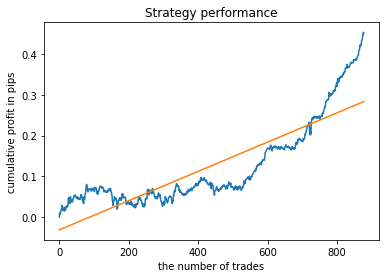

Score: 0.45371000000000833
Iteration:  62 R^2:  0.72152252243015


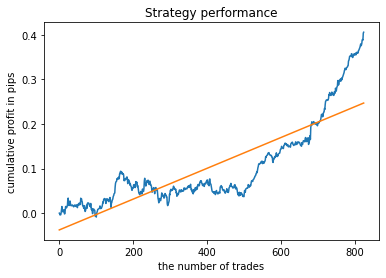

Score: 0.405740000000008
Iteration:  63 R^2:  0.9106437807266153


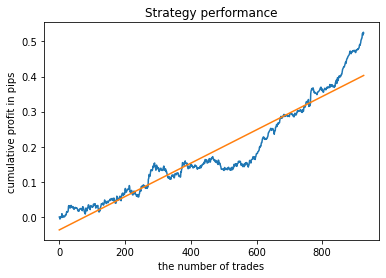

Score: 0.526050000000005
Iteration:  64 R^2:  0.7405994752159699


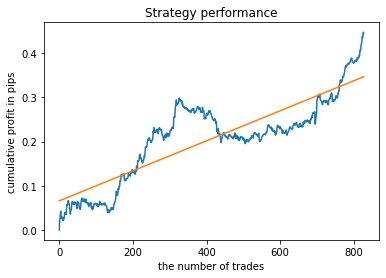

Score: 0.44739000000000717
Iteration:  65 R^2:  0.808457919630437


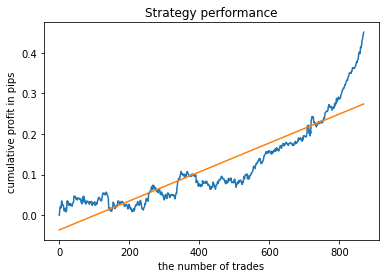

Score: 0.45067000000000884
Iteration:  66 R^2:  0.8720176095473158


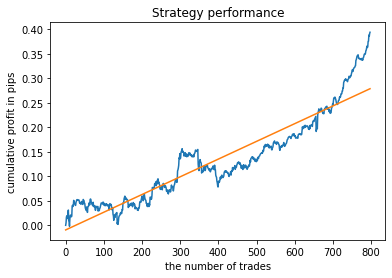

Score: 0.39375000000000415
Iteration:  67 R^2:  0.8932288606702861


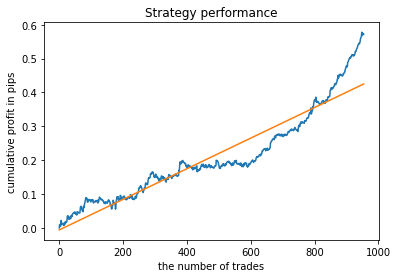

Score: 0.5776600000000133
Iteration:  68 R^2:  0.5215731431557393


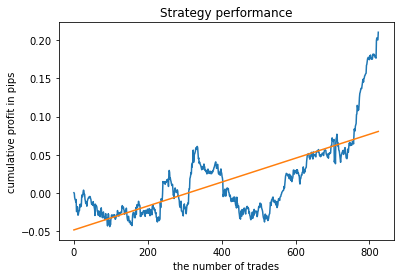

Score: 0.2107000000000055
Iteration:  69 R^2:  0.804747860299158


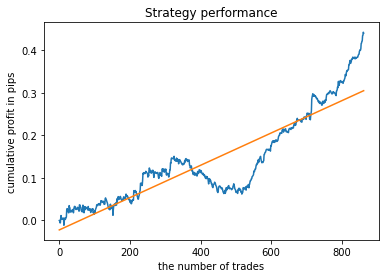

Score: 0.441960000000006
Iteration:  70 R^2:  0.5804124827045297


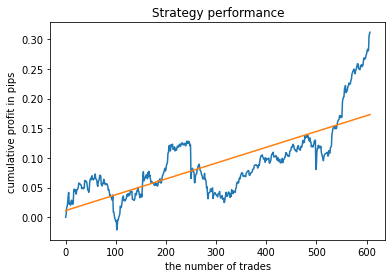

Score: 0.31173000000000206
Iteration:  71 R^2:  0.8324481754658041


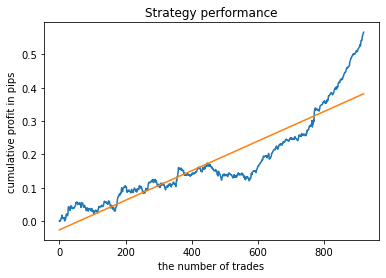

Score: 0.5667300000000088
Iteration:  72 R^2:  0.8469548641341241


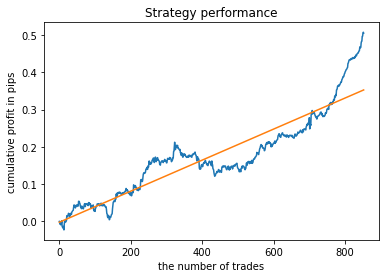

Score: 0.5075200000000073
Iteration:  73 R^2:  0.9445913810015266


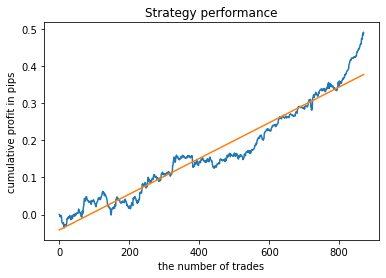

Score: 0.4920200000000162
Iteration:  74 R^2:  0.6753801380465243


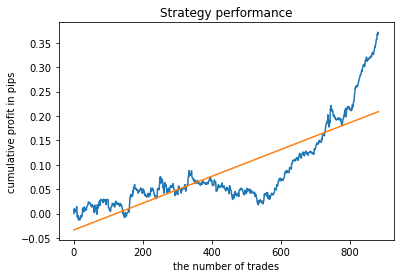

Score: 0.3716800000000049
Iteration:  75 R^2:  0.8142461354076168


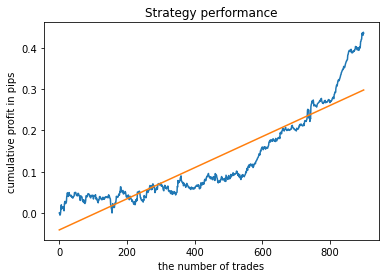

Score: 0.4382700000000079
Iteration:  76 R^2:  0.9164926754720379


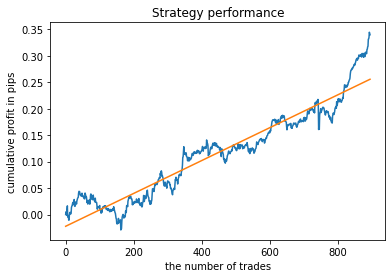

Score: 0.3444300000000099
Iteration:  77 R^2:  0.6737185558910819


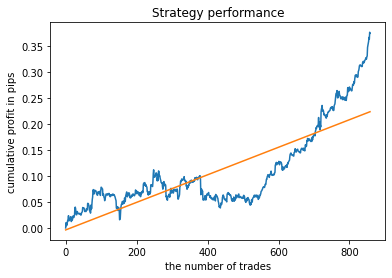

Score: 0.37704000000000026
Iteration:  78 R^2:  0.6667819845302005


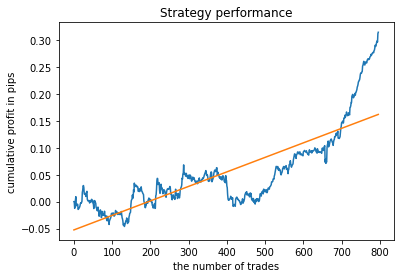

Score: 0.3148100000000018
Iteration:  79 R^2:  0.6015437748447731


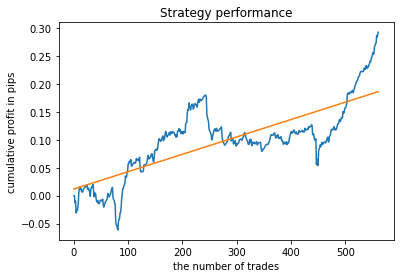

Score: 0.2932000000000027
Iteration:  80 R^2:  0.879173895810697


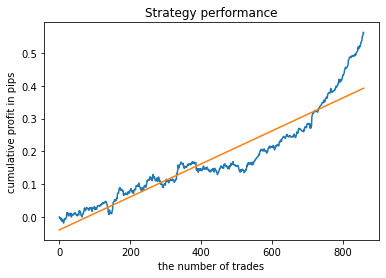

Score: 0.5633900000000098
Iteration:  81 R^2:  0.9087312337034678


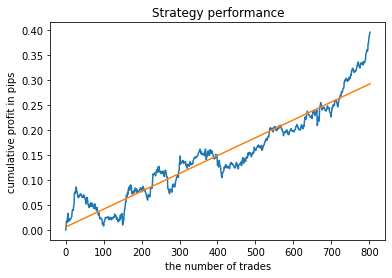

Score: 0.3949800000000091
Iteration:  82 R^2:  0.6449935394517673


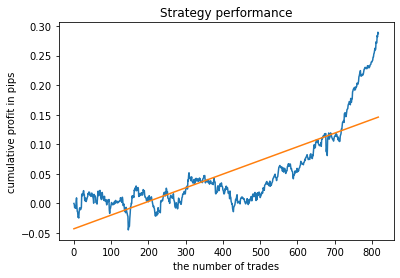

Score: 0.28952000000000255
Iteration:  83 R^2:  0.5121715830874048


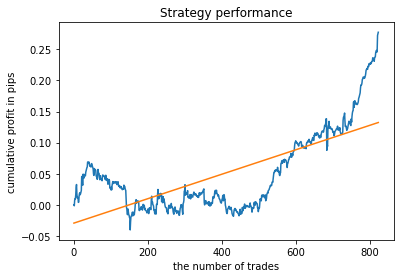

Score: 0.27767000000000663
Iteration:  84 R^2:  0.8191733890158001


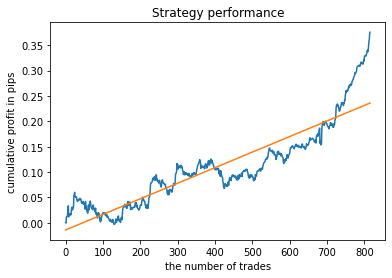

Score: 0.37566000000000677
Iteration:  85 R^2:  0.8209643058127524


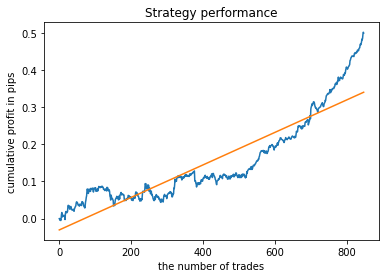

Score: 0.5012800000000062
Iteration:  86 R^2:  0.589813005474202


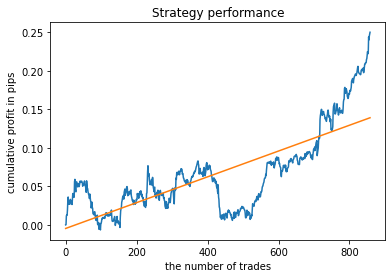

Score: 0.24991000000000707
Iteration:  87 R^2:  0.8626657238182026


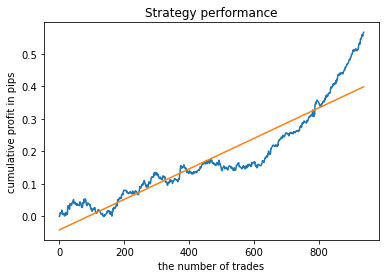

Score: 0.5672100000000077
Iteration:  88 R^2:  0.9028178706899035


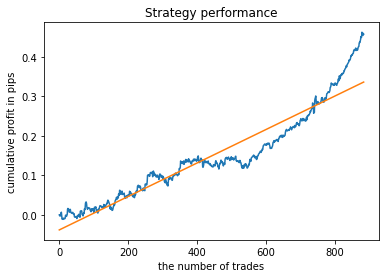

Score: 0.4627100000000103
Iteration:  89 R^2:  0.7695910413911404


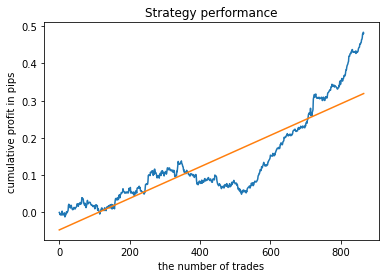

Score: 0.48362000000000543
Iteration:  90 R^2:  0.8038853754764793


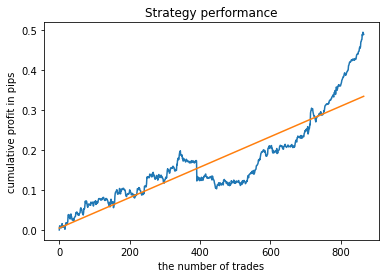

Score: 0.49462000000000694
Iteration:  91 R^2:  0.447605079764651


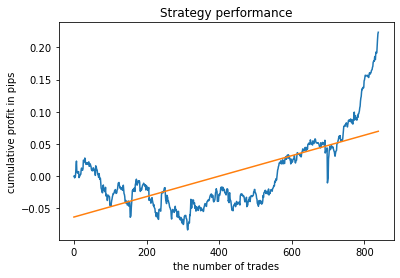

Score: 0.22335000000000407
Iteration:  92 R^2:  0.7260261739710422


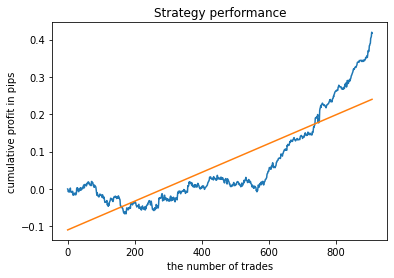

Score: 0.41951000000000876
Iteration:  93 R^2:  0.8694105424542734


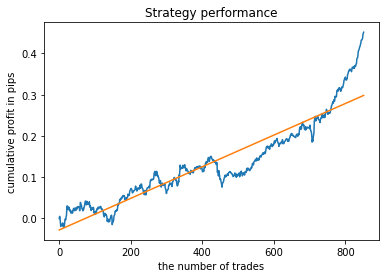

Score: 0.4514200000000109
Iteration:  94 R^2:  0.6541924998001412


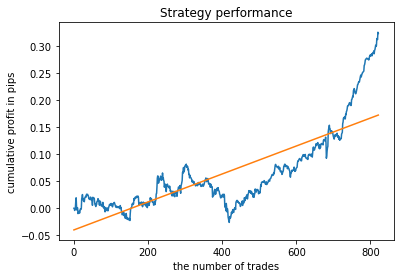

Score: 0.32495000000000573
Iteration:  95 R^2:  0.8190131565765847


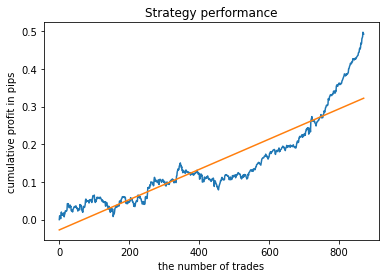

Score: 0.4971100000000036
Iteration:  96 R^2:  0.7227390443622924


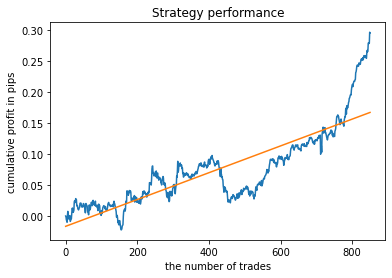

Score: 0.2967100000000013
Iteration:  97 R^2:  0.6208376342714522


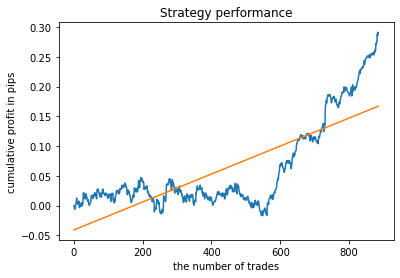

Score: 0.2914400000000019
Iteration:  98 R^2:  0.31891667829857717


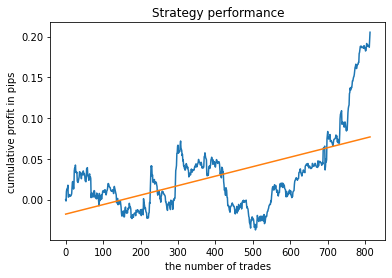

Score: 0.2053200000000036
Iteration:  99 R^2:  0.7485030605429586


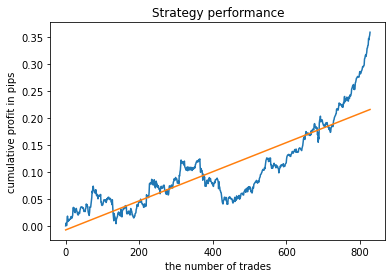

Score: 0.359440000000008
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Best model score: 0.9445913810015266  report score: 0.4920200000000162


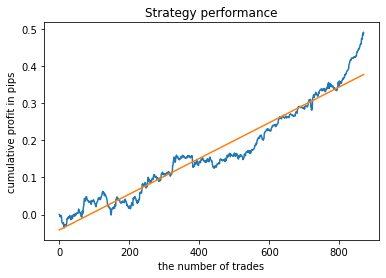

Score: 0.4920200000000162
The file cat_model.mqh has been written to disc
Best report score: 0.5776600000000133  model score: 0.8932288606702861


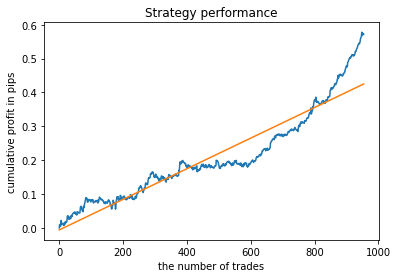

Score: 0.5776600000000133
The file cat_model.mqh has been written to disc
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<


In [30]:
hours = [17]
final_test_model(11, 100)

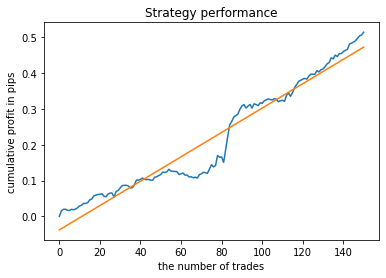

Iteration:  0 R^2:  0.4919760053902546


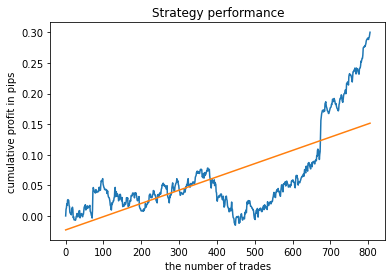

Score: 0.300339999999999
Iteration:  1 R^2:  0.06399103922600213


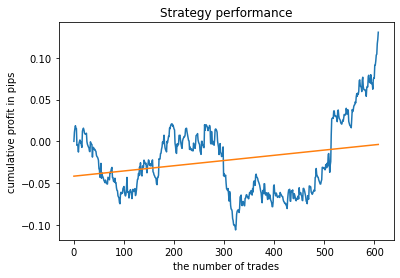

Score: 0.13069999999999593
Iteration:  2 R^2:  0.34363499526578367


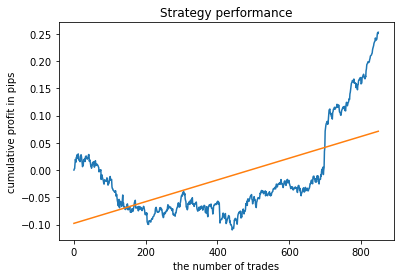

Score: 0.2527100000000022
Iteration:  3 R^2:  0.32879305708674167


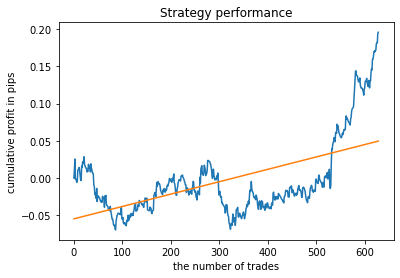

Score: 0.19589000000000123
Iteration:  4 R^2:  0.07609304509765313


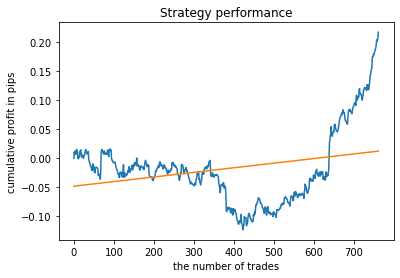

Score: 0.2166899999999956
Iteration:  5 R^2:  0.3388780919918878


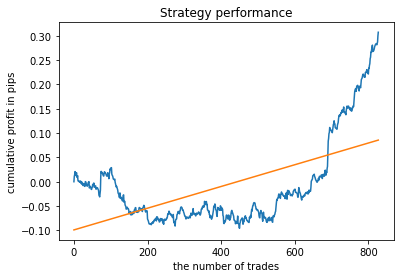

Score: 0.3073099999999982
Iteration:  6 R^2:  0.4573488030384882


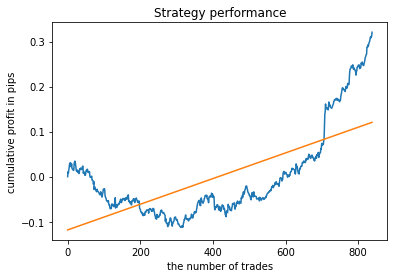

Score: 0.3207200000000042
Iteration:  7 R^2:  0.1718553207306861


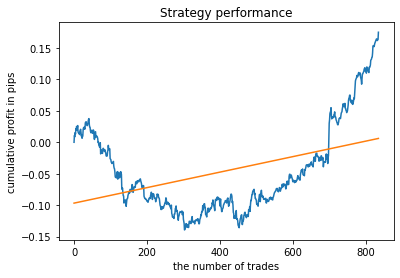

Score: 0.1751399999999994
Iteration:  8 R^2:  0.38603739968879114


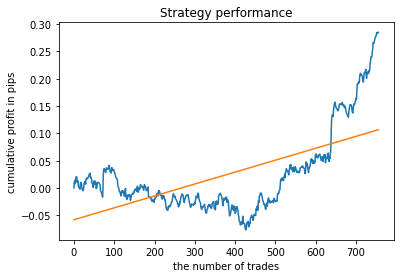

Score: 0.28519999999999857
Iteration:  9 R^2:  0.4938888672737367


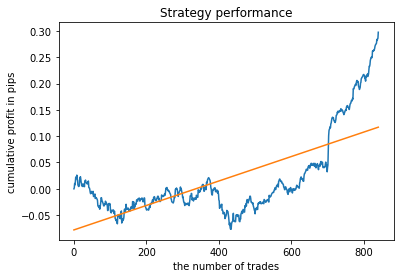

Score: 0.2974200000000016
Iteration:  10 R^2:  0.00039250876174867777


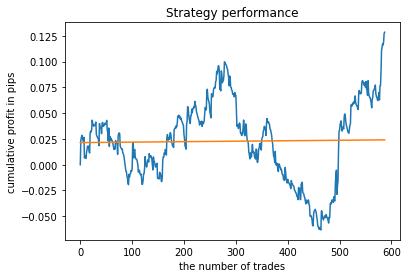

Score: 0.12848000000000157
Iteration:  11 R^2:  0.4877864728672583


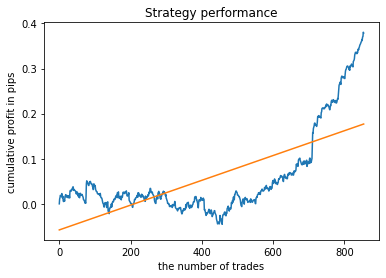

Score: 0.38048000000000026
Iteration:  12 R^2:  0.22648974980596093


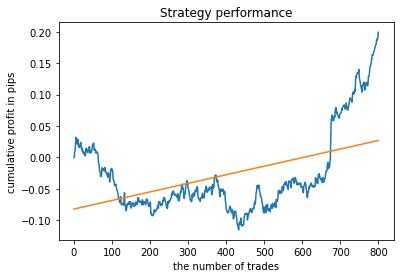

Score: 0.19929999999999604
Iteration:  13 R^2:  0.5486024536851356


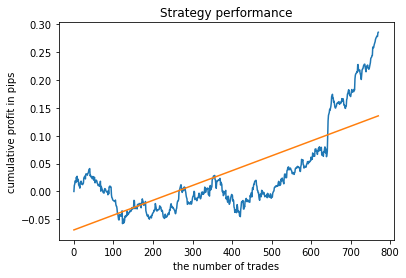

Score: 0.28599999999999737
Iteration:  14 R^2:  0.22525620599697682


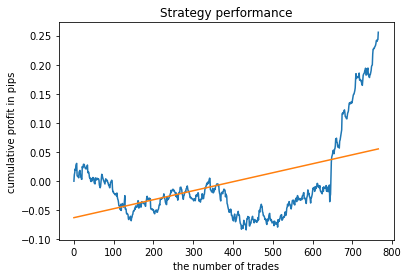

Score: 0.2557999999999947
Iteration:  15 R^2:  0.5484860011680154


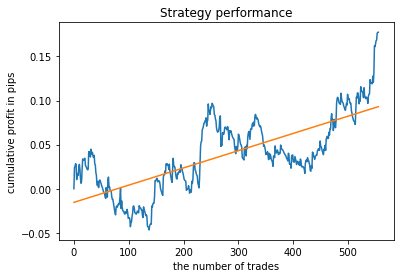

Score: 0.1773399999999979
Iteration:  16 R^2:  0.011088977868401795


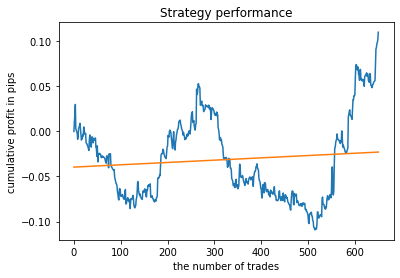

Score: 0.11016999999999677
Iteration:  17 R^2:  0.1663058089085736


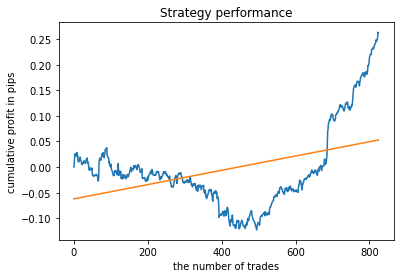

Score: 0.26347000000000176
Iteration:  18 R^2:  0.22719944401113845


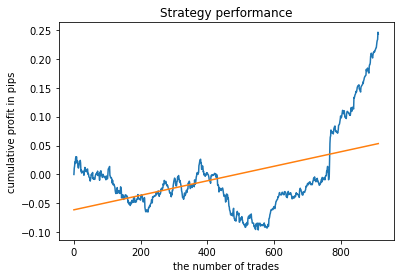

Score: 0.24605999999999667
Iteration:  19 R^2:  0.3967178200307172


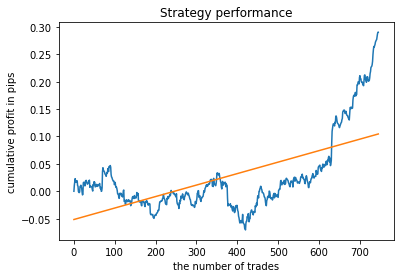

Score: 0.2902899999999953
Iteration:  20 R^2:  0.5359469999967


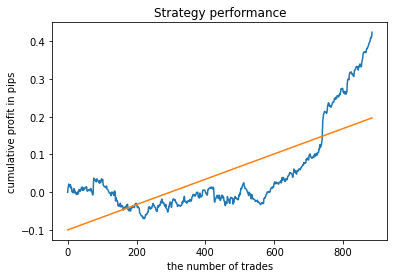

Score: 0.4233400000000049
Iteration:  21 R^2:  0.2605005508604957


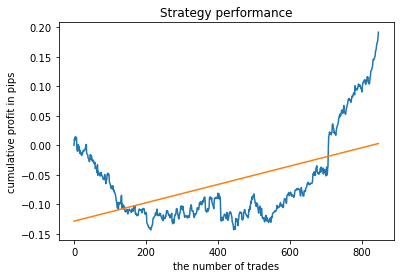

Score: 0.19142999999999905
Iteration:  22 R^2:  0.03779029675483392


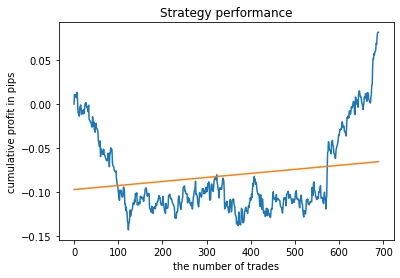

Score: 0.08147999999999755
Iteration:  23 R^2:  0.39298515097650477


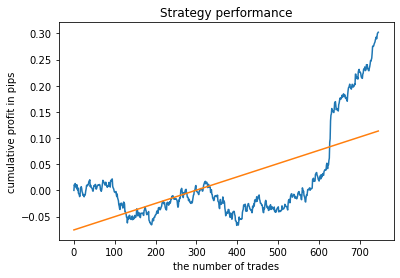

Score: 0.3022599999999963
Iteration:  24 R^2:  0.106115874027492


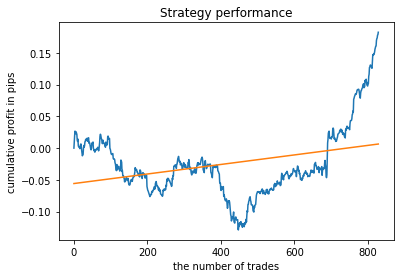

Score: 0.1825300000000003
Iteration:  25 R^2:  0.01998341770190659


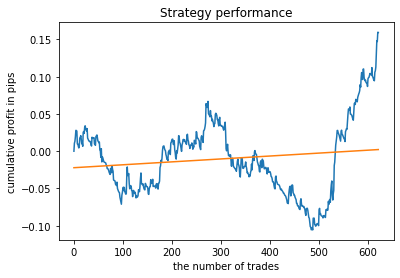

Score: 0.15962999999999122
Iteration:  26 R^2:  0.07656763370258446


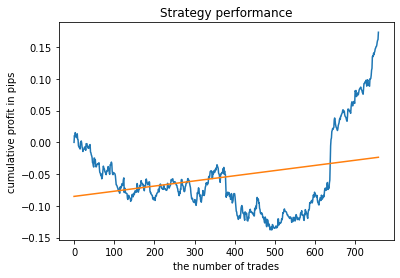

Score: 0.1733699999999997
Iteration:  27 R^2:  -0.05853272312029101


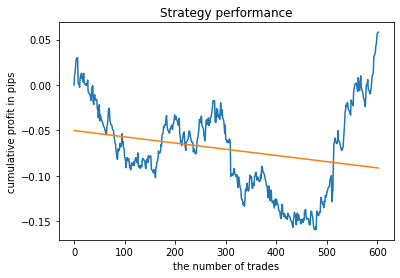

Score: 0.05797999999999667
Iteration:  28 R^2:  0.32742239389859


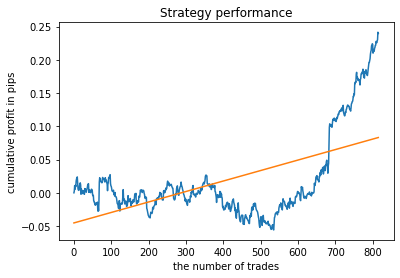

Score: 0.24152999999999444
Iteration:  29 R^2:  0.2693320529660842


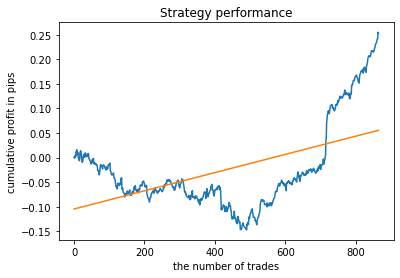

Score: 0.2551400000000044
Iteration:  30 R^2:  0.6086585654828613


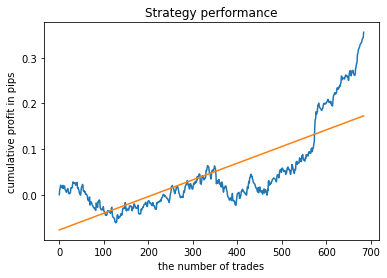

Score: 0.3561700000000002
Iteration:  31 R^2:  0.43913773850203836


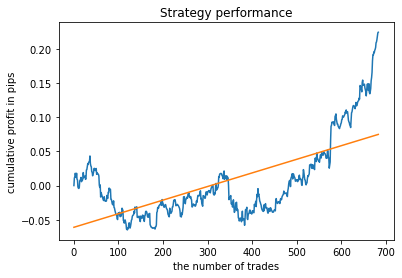

Score: 0.22449999999999595
Iteration:  32 R^2:  0.2892013297536862


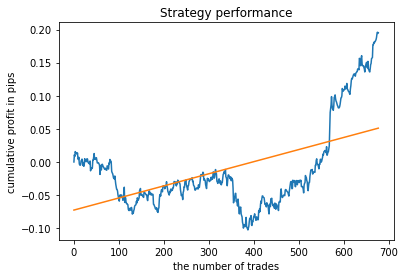

Score: 0.19585999999999837
Iteration:  33 R^2:  -0.4268230504317866


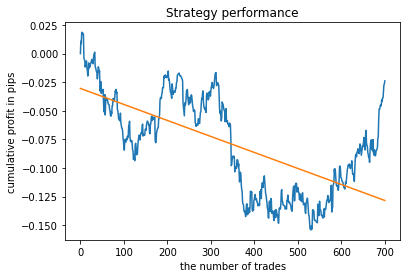

Score: 0.01868
Iteration:  34 R^2:  0.18051463918491115


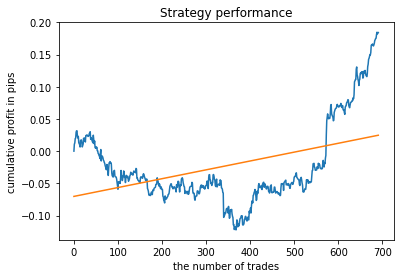

Score: 0.18466999999999417
Iteration:  35 R^2:  0.5231852588029797


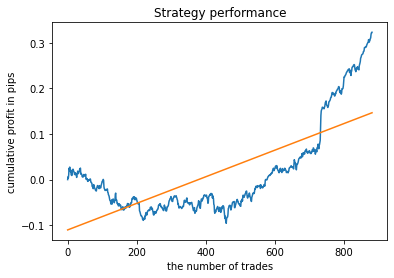

Score: 0.32297999999999494
Iteration:  36 R^2:  0.058819757465337186


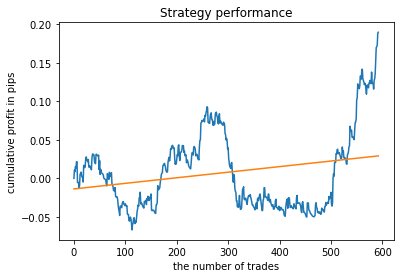

Score: 0.18965999999999328
Iteration:  37 R^2:  0.421551235949551


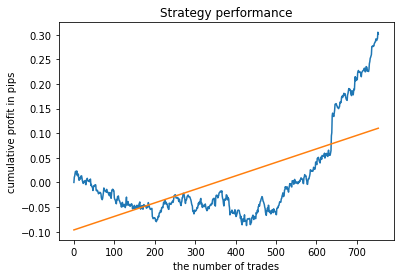

Score: 0.30493999999999916
Iteration:  38 R^2:  -0.10555470639156406


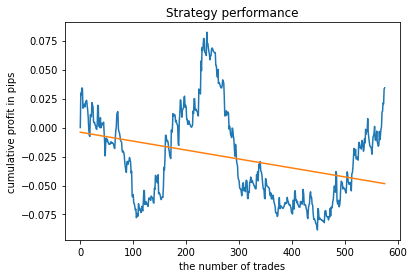

Score: 0.08216999999999948
Iteration:  39 R^2:  0.21216224709103004


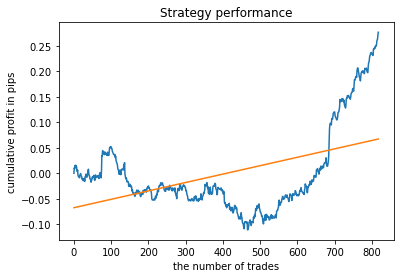

Score: 0.2765199999999989
Iteration:  40 R^2:  0.0977723177682287


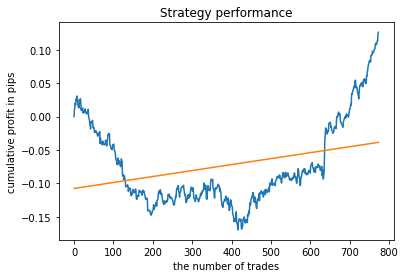

Score: 0.12627999999999762
Iteration:  41 R^2:  -0.13544385439261997


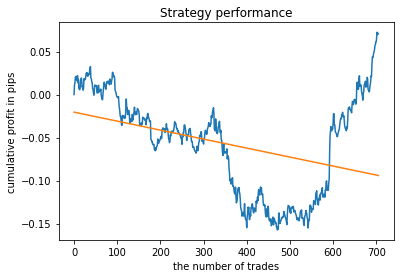

Score: 0.07238999999999636
Iteration:  42 R^2:  0.10016709232690801


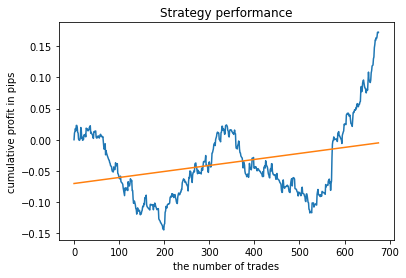

Score: 0.17260999999999393
Iteration:  43 R^2:  0.5219614423197401


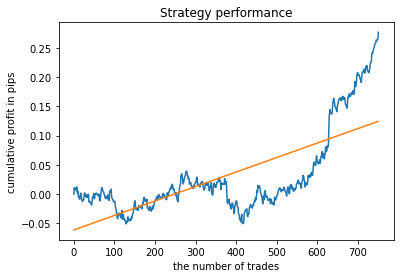

Score: 0.2765000000000002
Iteration:  44 R^2:  0.16990228242182281


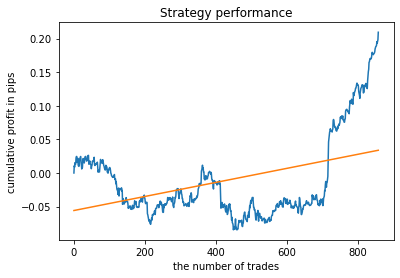

Score: 0.20951000000000103
Iteration:  45 R^2:  0.3125545624795214


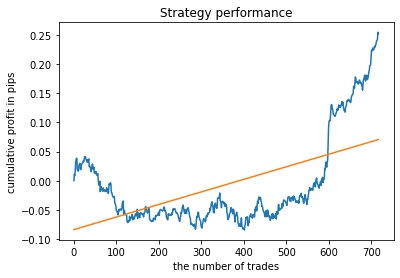

Score: 0.25484
Iteration:  46 R^2:  0.423486701541408


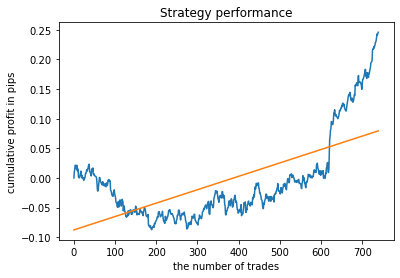

Score: 0.24588999999999742
Iteration:  47 R^2:  0.7368557893401109


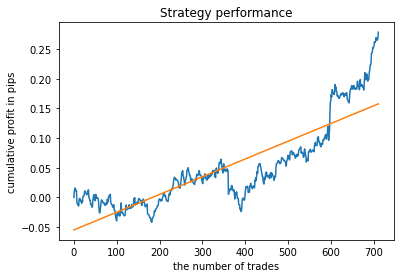

Score: 0.2782799999999997
Iteration:  48 R^2:  0.21827932321805


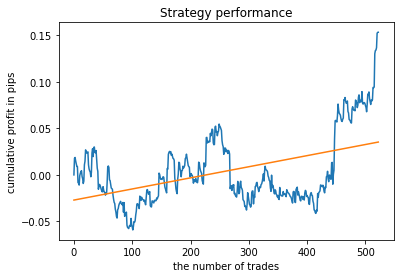

Score: 0.15311999999999817
Iteration:  49 R^2:  0.4792824046532919


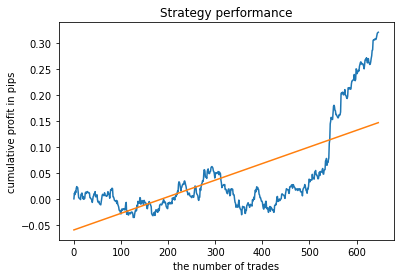

Score: 0.32127999999999546
Iteration:  50 R^2:  0.48176012889649344


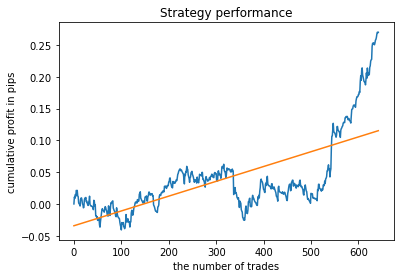

Score: 0.27011999999999614
Iteration:  51 R^2:  0.08633018941730164


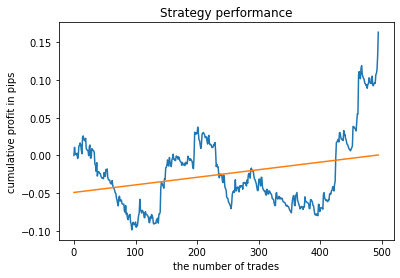

Score: 0.1634899999999988
Iteration:  52 R^2:  0.5092834704776019


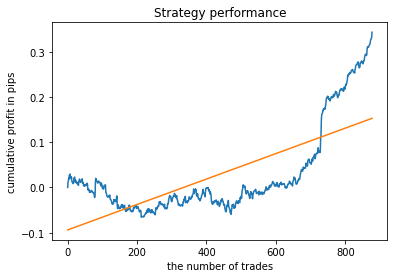

Score: 0.3430899999999971
Iteration:  53 R^2:  0.31971313666213064


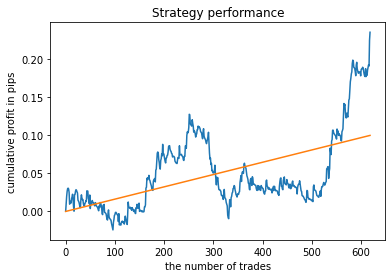

Score: 0.23524999999999707
Iteration:  54 R^2:  0.18123694399325485


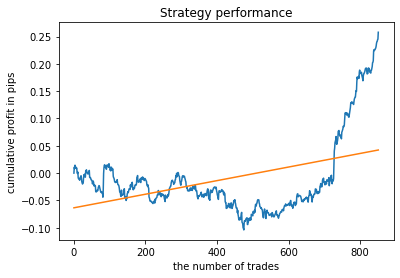

Score: 0.257929999999998
Iteration:  55 R^2:  0.41786003221354817


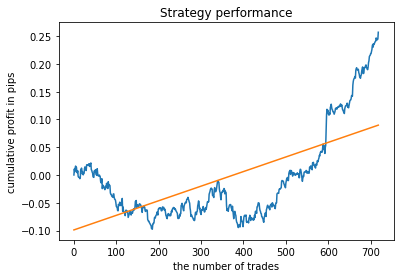

Score: 0.2570099999999999
Iteration:  56 R^2:  0.24200506700211488


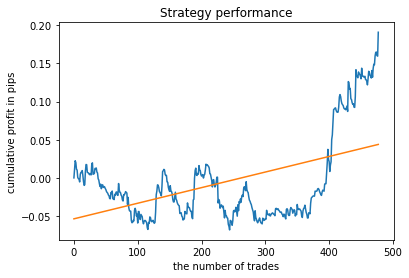

Score: 0.1907699999999991
Iteration:  57 R^2:  -0.035895292956365954


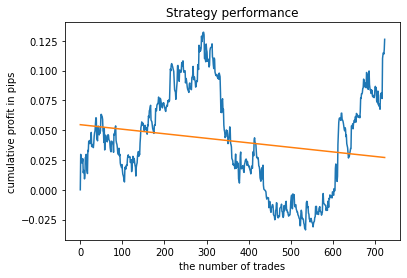

Score: 0.1321900000000018
Iteration:  58 R^2:  0.30016258683526553


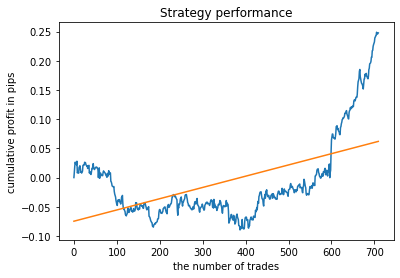

Score: 0.2488899999999974
Iteration:  59 R^2:  -0.5835907877108162


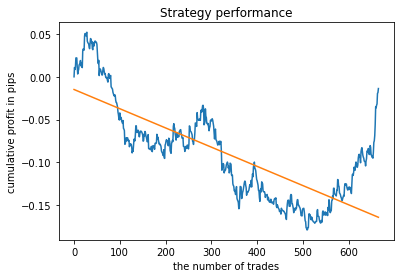

Score: 0.052059999999999676
Iteration:  60 R^2:  0.4014101214125346


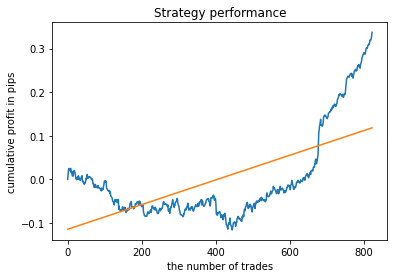

Score: 0.33766999999999975
Iteration:  61 R^2:  0.3766429489405313


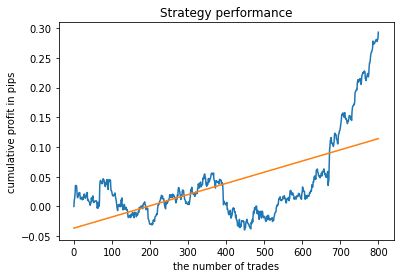

Score: 0.2932800000000002
Iteration:  62 R^2:  0.09427491644980113


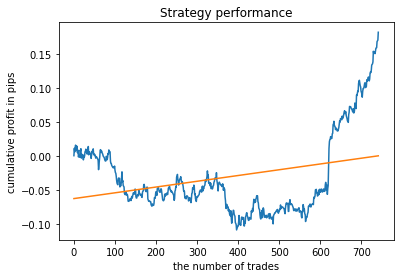

Score: 0.18148999999999782
Iteration:  63 R^2:  0.5490968577630395


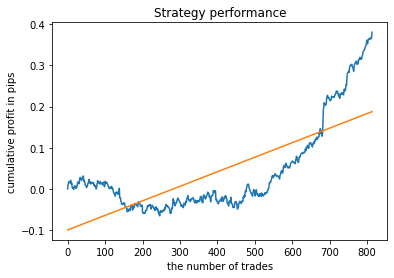

Score: 0.38062999999999814
Iteration:  64 R^2:  0.0025372598773908406


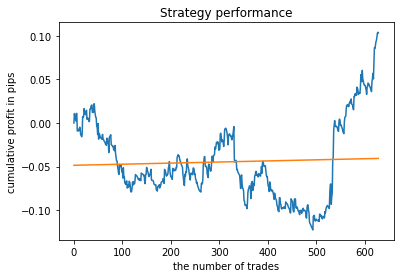

Score: 0.10408999999999852
Iteration:  65 R^2:  0.4228174343597343


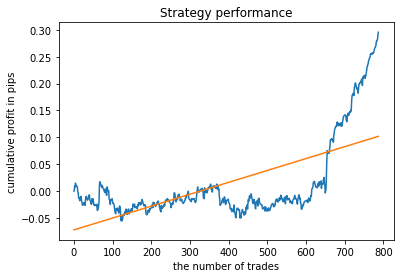

Score: 0.2954599999999996
Iteration:  66 R^2:  -0.011556598507988071


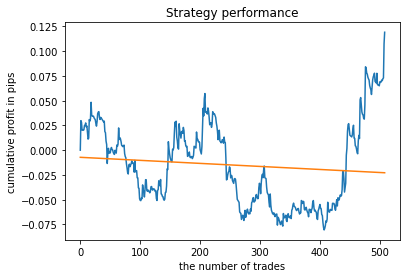

Score: 0.1191199999999989
Iteration:  67 R^2:  0.5188943714103318


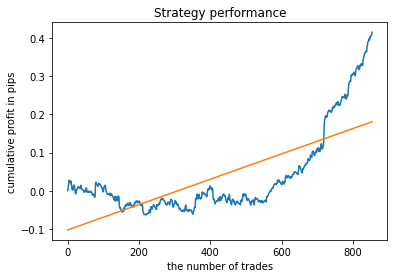

Score: 0.41586999999999796
Iteration:  68 R^2:  0.2602721619088074


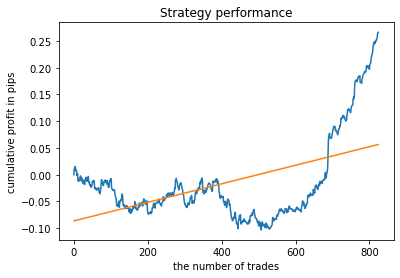

Score: 0.2662999999999974
Iteration:  69 R^2:  0.6263552904783192


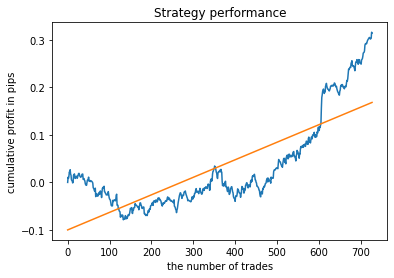

Score: 0.3155999999999943
Iteration:  70 R^2:  0.6801422163421995


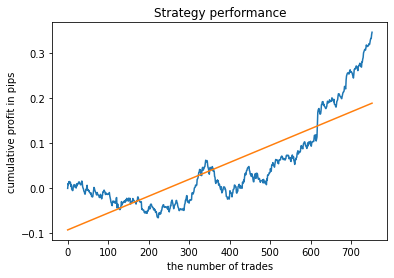

Score: 0.34695999999999905
Iteration:  71 R^2:  0.6523767946462818


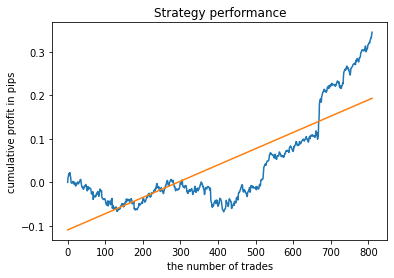

Score: 0.3456000000000008
Iteration:  72 R^2:  0.34730928197236655


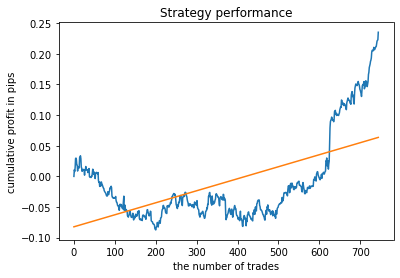

Score: 0.2352999999999963
Iteration:  73 R^2:  0.4168959408127444


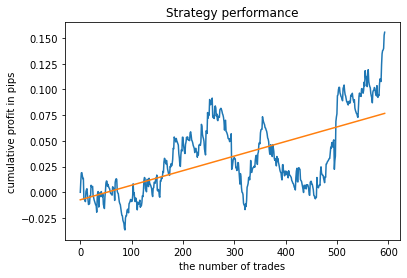

Score: 0.15561999999999876
Iteration:  74 R^2:  0.2600357110257977


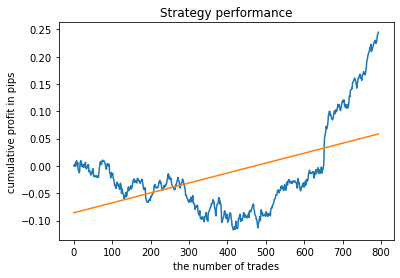

Score: 0.24490000000000156
Iteration:  75 R^2:  0.1551329684574535


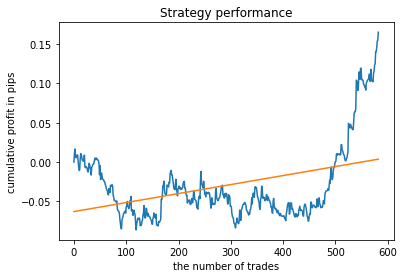

Score: 0.16516999999999227
Iteration:  76 R^2:  0.5716289148766565


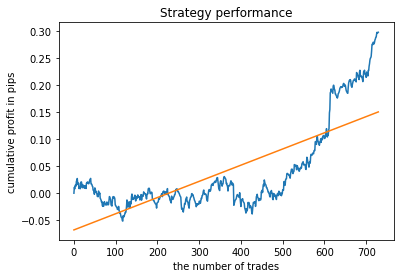

Score: 0.29810000000000114
Iteration:  77 R^2:  0.17054810036597523


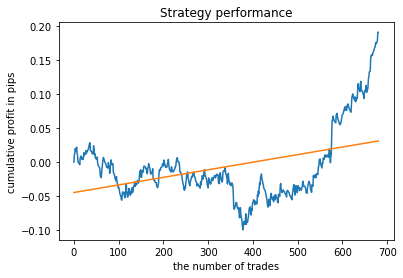

Score: 0.19110999999999737
Iteration:  78 R^2:  0.6034813937759409


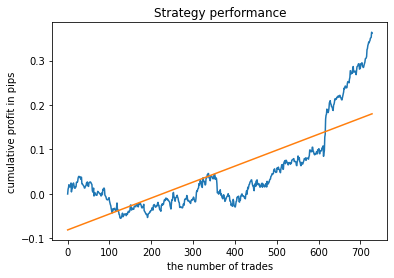

Score: 0.3635099999999989
Iteration:  79 R^2:  0.34167414694987097


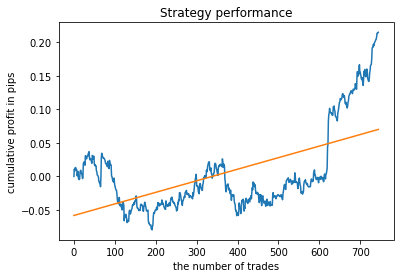

Score: 0.21514999999999443
Iteration:  80 R^2:  0.05071007020712681


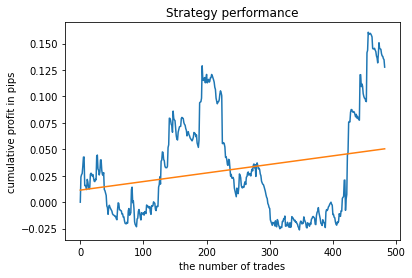

Score: 0.16069000000000006
Iteration:  81 R^2:  0.33109108393485254


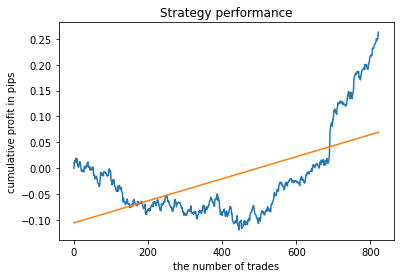

Score: 0.2627799999999978
Iteration:  82 R^2:  0.350463913626774


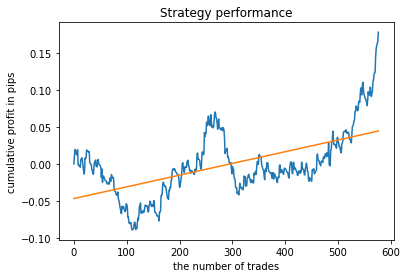

Score: 0.17762000000000133
Iteration:  83 R^2:  0.39126131692244503


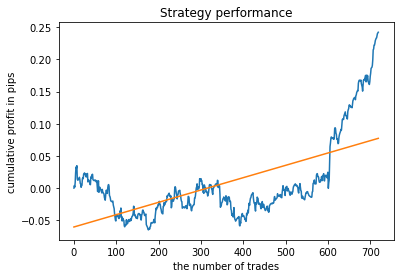

Score: 0.2421400000000022
Iteration:  84 R^2:  0.3306965327285938


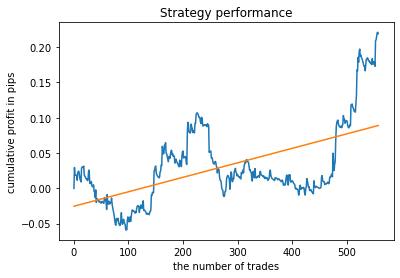

Score: 0.22110999999999642
Iteration:  85 R^2:  0.5190981575980276


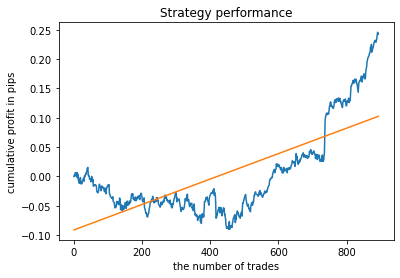

Score: 0.2459700000000018
Iteration:  86 R^2:  0.687589545096392


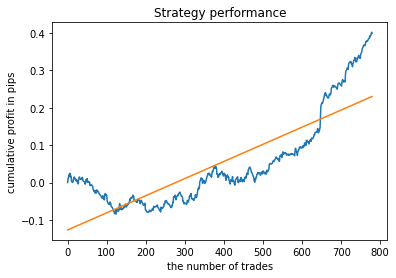

Score: 0.40184999999999677
Iteration:  87 R^2:  -0.1083104202182329


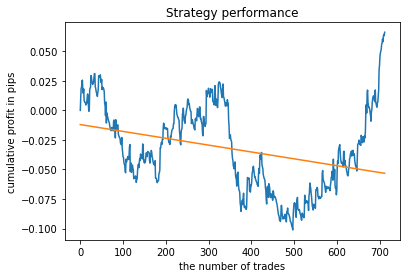

Score: 0.06607999999999396
Iteration:  88 R^2:  0.37388548717907766


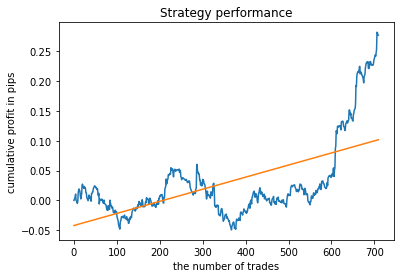

Score: 0.2818999999999978
Iteration:  89 R^2:  0.8520506976241773


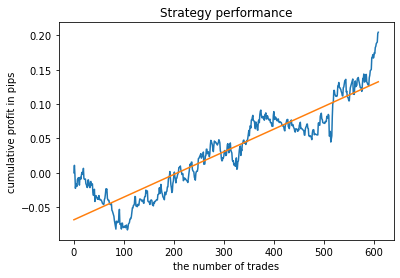

Score: 0.20467999999999753
Iteration:  90 R^2:  0.30006889685777594


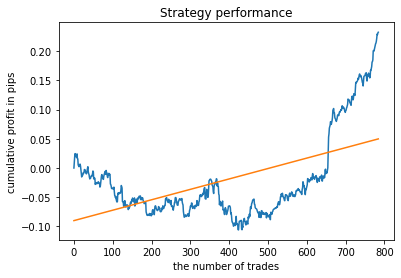

Score: 0.23260999999999854
Iteration:  91 R^2:  0.5736909003921619


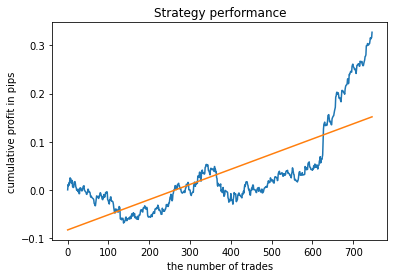

Score: 0.3274899999999923
Iteration:  92 R^2:  0.3384623157069342


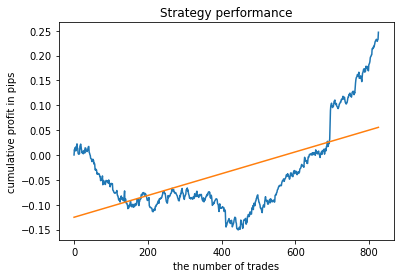

Score: 0.24684999999999924
Iteration:  93 R^2:  0.5935490518664763


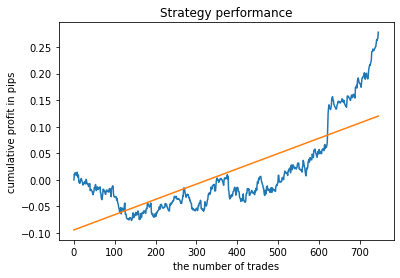

Score: 0.2776299999999978
Iteration:  94 R^2:  0.3646001677087707


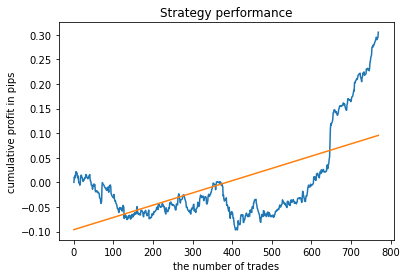

Score: 0.30509999999999887
Iteration:  95 R^2:  0.5221964976850801


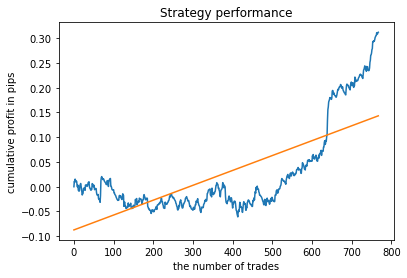

Score: 0.3120499999999994
Iteration:  96 R^2:  0.10209215318940991


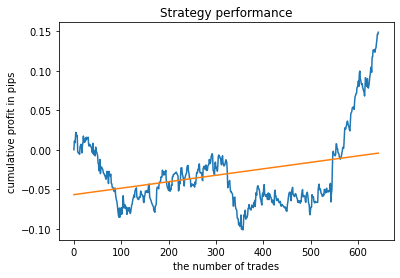

Score: 0.14859999999999482
Iteration:  97 R^2:  0.3323719175308216


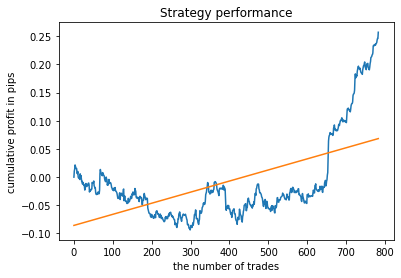

Score: 0.257149999999997
Iteration:  98 R^2:  0.007407505636378264


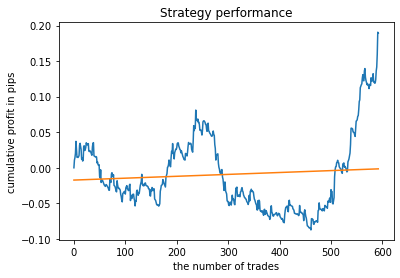

Score: 0.1905399999999875
Iteration:  99 R^2:  0.38613340557887543


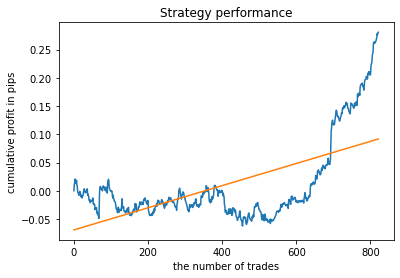

Score: 0.28063000000000116
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Best model score: 0.8520506976241773  report score: 0.20467999999999753


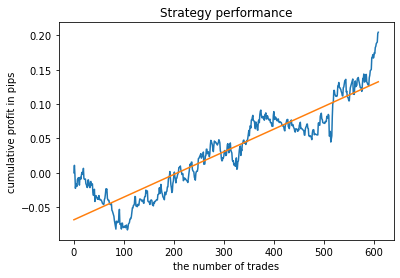

Score: 0.20467999999999753
The file cat_model.mqh has been written to disc
Best report score: 0.4233400000000049  model score: 0.5359469999967


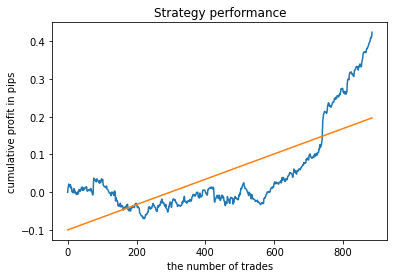

Score: 0.4233400000000049
The file cat_model.mqh has been written to disc
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<


In [31]:
hours = [2]
final_test_model(8, 100)

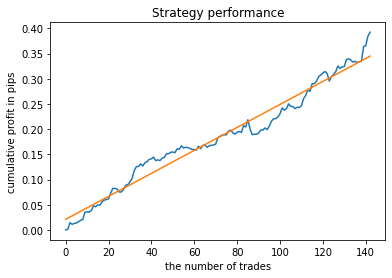

Iteration:  0 R^2:  0.8948953742711533


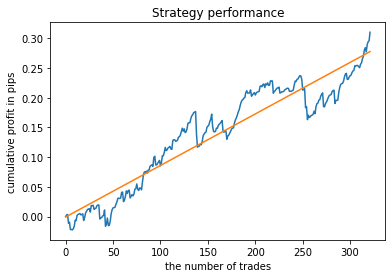

Score: 0.31012000000000295
Iteration:  1 R^2:  0.7600268597369283


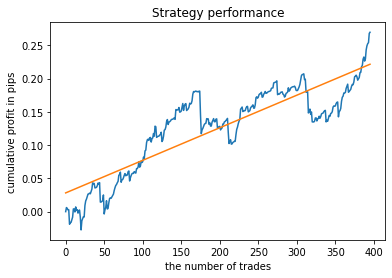

Score: 0.26965000000000455
Iteration:  2 R^2:  0.8519096517079274


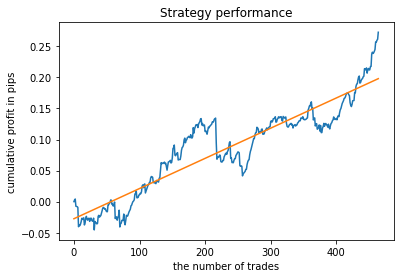

Score: 0.2727500000000021
Iteration:  3 R^2:  0.8562238955798683


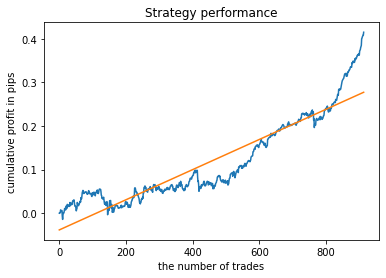

Score: 0.4150500000000036
Iteration:  4 R^2:  0.9103331022134042


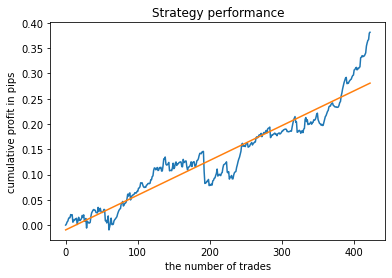

Score: 0.3815800000000027
Iteration:  5 R^2:  0.8516284725518073


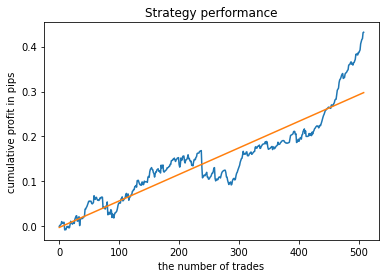

Score: 0.4319900000000024
Iteration:  6 R^2:  0.8434652138127948


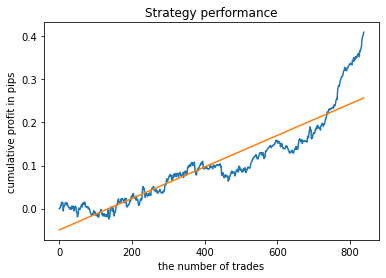

Score: 0.4093900000000081
Iteration:  7 R^2:  0.9226820093938404


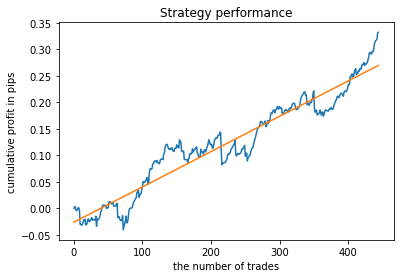

Score: 0.3320400000000016
Iteration:  8 R^2:  0.945021314651984


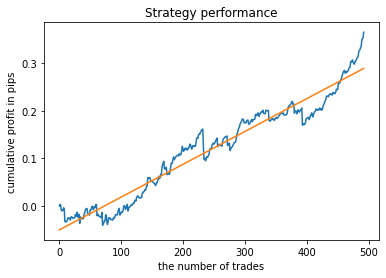

Score: 0.3651200000000024
Iteration:  9 R^2:  0.9222481232267981


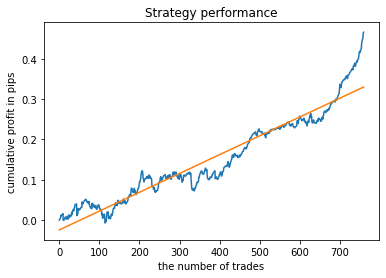

Score: 0.46566000000000063
Iteration:  10 R^2:  0.9233037269713903


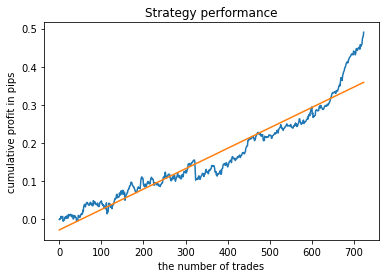

Score: 0.4903000000000065
Iteration:  11 R^2:  0.9371327824946886


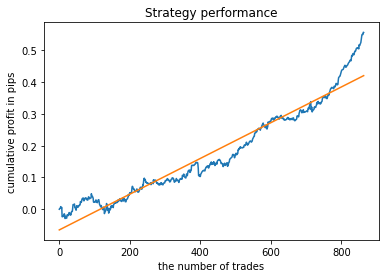

Score: 0.5571200000000056
Iteration:  12 R^2:  0.9018024617619188


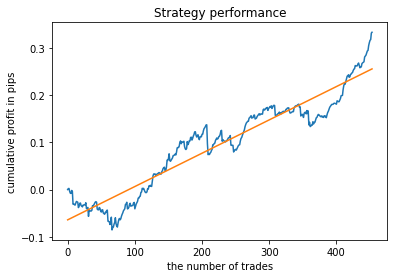

Score: 0.33395000000000213
Iteration:  13 R^2:  0.8041077029606475


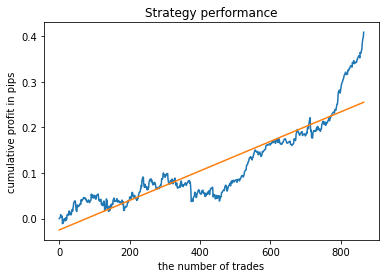

Score: 0.40866000000000724
Iteration:  14 R^2:  0.9465546029052835


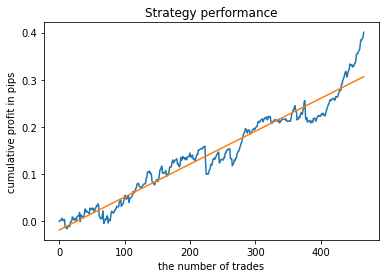

Score: 0.40056000000000097
Iteration:  15 R^2:  0.7772366983622611


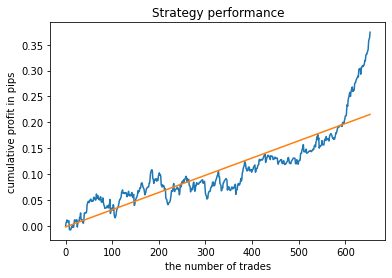

Score: 0.3743000000000001
Iteration:  16 R^2:  0.8277932897715014


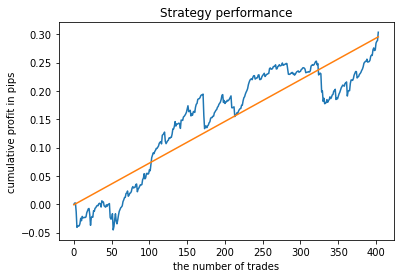

Score: 0.3033700000000008
Iteration:  17 R^2:  0.901465020895711


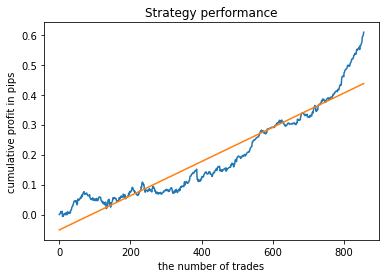

Score: 0.6084700000000092
Iteration:  18 R^2:  0.8040710525301511


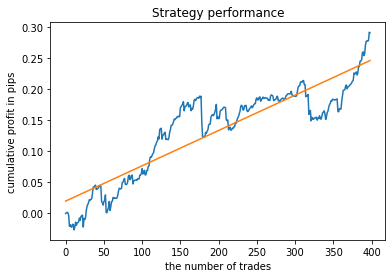

Score: 0.2915099999999996
Iteration:  19 R^2:  0.9182355019724154


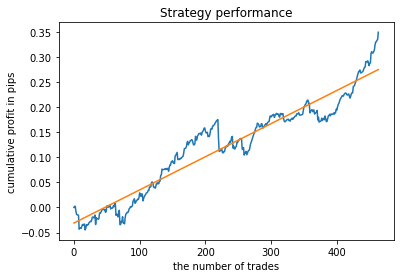

Score: 0.34966000000000086
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Best model score: 0.9465546029052835  report score: 0.40056000000000097


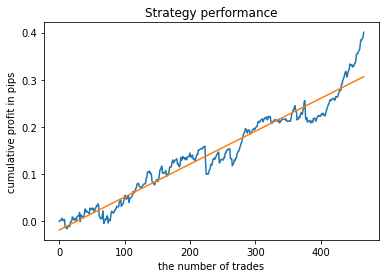

Score: 0.40056000000000097
The file cat_model.mqh has been written to disc
Best report score: 0.6084700000000092  model score: 0.901465020895711


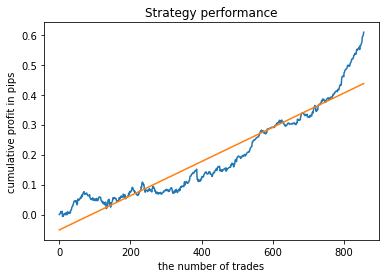

Score: 0.6084700000000092
The file cat_model.mqh has been written to disc
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<


In [32]:
hours = [21]
final_test_model(8)

Iteration:  0 R^2:  0.5601968024228434
Iteration:  1 R^2:  0.8709043117736378
Iteration:  2 R^2:  0.8173165585490128
Iteration:  3 R^2:  0.73550686795952
Iteration:  4 R^2:  0.9029312539810096
Iteration:  5 R^2:  0.9008464115710568
Iteration:  6 R^2:  0.8515035489121368
Iteration:  7 R^2:  0.9185916214169036
Iteration:  8 R^2:  0.7432593757795884
Iteration:  9 R^2:  0.9003669808868882
Iteration:  10 R^2:  0.8496033503647571
Iteration:  11 R^2:  0.804060907599098
Iteration:  12 R^2:  0.3519250597799657
Iteration:  13 R^2:  0.8746205667952115
Iteration:  14 R^2:  0.847740947902803
Iteration:  15 R^2:  0.7270620570141771
Iteration:  16 R^2:  0.9278003344095979
Iteration:  17 R^2:  0.7912695301891199
Iteration:  18 R^2:  0.5889800789115178
Iteration:  19 R^2:  0.7673654147453985


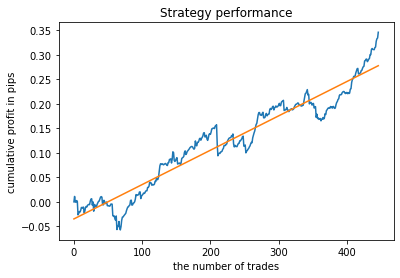

In [27]:

# perform GMM clasterizatin over dataset
# gmm = mixture.BayesianGaussianMixture(n_components=n_compnents, covariance_type='full').fit(X)
gmm = mixture.GaussianMixture(
    n_components=n_compnents, covariance_type='full', n_init=1).fit(pr[pr.columns[1:]])

# iterative learning
res = []
for i in range(20):
    res.append(brute_force(10000, gmm))
    print('Iteration: ', i, 'R^2: ', res[-1][0])

# test best model
res.sort()
test_model(res[-1])

# export best model to mql
# export_model_to_MQL_code(res[-1][1])

Iteration:  0 R^2:  0.8780662024132793
Iteration:  1 R^2:  0.8675235782184878
Iteration:  2 R^2:  0.8383415972433388
Iteration:  3 R^2:  0.8937796908885958
Iteration:  4 R^2:  0.7992521643950588
Iteration:  5 R^2:  0.8812188246842488
Iteration:  6 R^2:  0.9152818454216393
Iteration:  7 R^2:  0.8461253776431664
Iteration:  8 R^2:  0.869847018765737
Iteration:  9 R^2:  0.7714016405403765
Iteration:  10 R^2:  0.41970804164441944
Iteration:  11 R^2:  0.8719412755440904
Iteration:  12 R^2:  0.7822696884208755
Iteration:  13 R^2:  0.9082900886216243
Iteration:  14 R^2:  0.9510060838452807
Iteration:  15 R^2:  0.7661476236110094
Iteration:  16 R^2:  0.932435588767524
Iteration:  17 R^2:  0.943937980624271
Iteration:  18 R^2:  0.7228253220689783
Iteration:  19 R^2:  0.9540228623062078


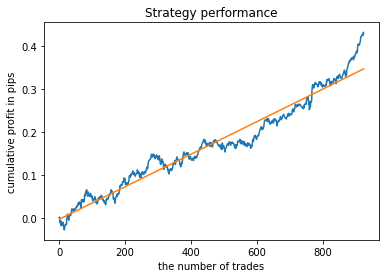

In [10]:
# perform GMM clasterizatin over dataset
gmm = mixture.BayesianGaussianMixture(n_components=n_compnents, covariance_type='full').fit(pr[pr.columns[1:]])
#gmm = mixture.GaussianMixture(n_components=n_compnents, covariance_type='full', n_init=1).fit(pr[pr.columns[1:]])

# iterative learning
res = []
for i in range(20):
    res.append(brute_force(10000, gmm))
    print('Iteration: ', i, 'R^2: ', res[-1][0])

# test best model
res.sort()
test_model(res[-1])

In [11]:
def export_model_to_MQL_code(model):
    model.save_model('catmodel_eurusd.h',
           format="cpp",
           export_parameters=None,
           pool=None)

In [13]:
export_model_to_MQL_code(res[-1][1])